# Imports

In [1]:
import pandas as pd 
import numpy as np 
import seaborn as sn
from matplotlib import pyplot as plt
import math

from tqdm import tqdm


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## Constant

In [0]:
# FIGSIZE

BIG = (15,8)
MEDIUM = (12,6)
SMALL = (8,5)

sn.set(rc={'figure.figsize':MEDIUM})

# FEATURES
SENSORS_FEATURES = ['temp', 'precip', 'rel_humidity', 'wind_dir', 'wind_spd', 'atmos_press']


# Load Data

In [0]:
data = pd.read_csv("./Train.csv")
test = pd.read_csv("./Test.csv")
test_id = test.ID

info = pd.read_csv('./airqo_metadata.csv', index_col=[0])

data.shape, test.shape, info.shape

# Load Data from Colab

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [5]:
data = pd.read_csv("/content/drive/My Drive/Data_csv/AirQo/Train.csv")
test = pd.read_csv("/content/drive/My Drive/Data_csv/AirQo/Test.csv")

info = pd.read_csv('/content/drive/My Drive/Data_csv/AirQo/airqo_metadata.csv', index_col=[0])

data.shape, test.shape, info.shape

((15539, 9), (5035, 8), (5, 16))

In [0]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15539 entries, 0 to 15538
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   ID            15539 non-null  object 
 1   location      15539 non-null  object 
 2   temp          15539 non-null  object 
 3   precip        15539 non-null  object 
 4   rel_humidity  15539 non-null  object 
 5   wind_dir      15539 non-null  object 
 6   wind_spd      15539 non-null  object 
 7   atmos_press   15539 non-null  object 
 8   target        15539 non-null  float64
dtypes: float64(1), object(8)
memory usage: 1.1+ MB


In [0]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5035 entries, 0 to 5034
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   ID            5035 non-null   object
 1   location      5035 non-null   object
 2   temp          5035 non-null   object
 3   precip        5035 non-null   object
 4   rel_humidity  5035 non-null   object
 5   wind_dir      5035 non-null   object
 6   wind_spd      5035 non-null   object
 7   atmos_press   5035 non-null   object
dtypes: object(8)
memory usage: 314.8+ KB


In [0]:
info.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5 entries, 0 to 4
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   location           5 non-null      object 
 1   loc_altitude       5 non-null      float64
 2   km2                5 non-null      float64
 3   aspect             5 non-null      float64
 4   dist_motorway      0 non-null      float64
 5   dist_trunk         3 non-null      float64
 6   dist_primary       4 non-null      float64
 7   dist_secondary     4 non-null      float64
 8   dist_tertiary      5 non-null      float64
 9   dist_unclassified  5 non-null      float64
 10  dist_residential   5 non-null      float64
 11  popn               5 non-null      int64  
 12  hh                 5 non-null      int64  
 13  hh_cook_charcoal   5 non-null      int64  
 14  hh_cook_firewood   5 non-null      int64  
 15  hh_burn_waste      5 non-null      int64  
dtypes: float64(10), int64(5), obje

## Info

In [0]:
data.head(10)

In [0]:
test

,ID,location,temp,precip,rel_humidity,wind_dir,wind_spd,atmos_press
0,ID_test_0,C,"23.96666667,22.88333333,22.28333333,21.4833333...","0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0....","0.6898333329999999,0.722333333,0.7755833329999...","290.1352379,328.47011289999995,323.5730796,282...","0.6333333329999999,0.725,0.955,0.8725,0.6925,0...","87.64333333,87.67,87.70583333,87.75083333,87.7..."
1,ID_test_1,C,"18.99166667,19.70833333,20.95833333,22.7833333...","0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0....","0.99975,0.99725,0.956333333,0.851583333,0.7775...","295.2350543,307.6569135,313.7360236,311.518385...","0.640833333,1.244166667,1.284166667,1.2875,1.3...","87.8925,87.95666667,87.9925,87.9925,87.9808333..."
2,ID_test_10,D,"25.11666667,25.08333333,24.40833333,23.575,22....","0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0....","0.760166667,0.733583333,0.78475,0.825833333,0....","77.06161145,95.48124997,61.44498258,89.4688360...","2.0133333330000003,1.3025,0.783333333,0.530833...","90.34,90.2975,90.305,90.35583333,90.4425,90.49..."
3,ID_test_100,C,"18.71666667,20.60833333,22.28333333,23.9833333...","0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.604,0.0,0.0,...","0.951416667,0.92575,0.8603333329999999,0.77883...","310.7509058,316.186793,324.8167326,327.2174992...","0.745,1.169166667,1.316666667,1.385,1.40083333...","87.98833333,88.06333333,88.07833333,88.0366666..."
4,ID_test_1000,D,"17.63333333,18.05833333,19.625,21.28333333,23....","0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0....","0.9,0.898333333,0.8725,0.831666667,0.820833332...","334.6054069,329.6848561000001,322.7668036,312....","0.620833333,0.5,0.456666667,0.558333333,1.0158...","90.515,90.5575,90.62333333,90.6825,90.67916667..."
...,...,...,...,...,...,...,...,...
5030,ID_test_995,C,"25.925,25.80833333,24.58333333,24.0,24.0583333...","0.0,0.0,0.0,0.408,0.017,0.0,0.0,0.0,0.0,0.0,0....","0.645416667,0.637416667,0.705333333,0.69883333...","329.8319536,343.2603743,167.5577726,161.143578...","0.749166667,0.7425,1.3766666669999998,1.49,0.6...","87.8075,87.73833333,87.66166667,87.55666667,87..."
5031,ID_test_996,D,"22.16666667,21.68333333,20.15833333,19.825,19....","0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0....","0.82275,0.827666667,0.876416667,0.888916667,0....","291.1252201000001,277.1125974,248.1977595,292....","0.980833333,0.78,0.45,0.46,0.425833333,0.29833...","90.75166667,90.68916667,90.61916667,90.57,90.5..."
5032,ID_test_997,E,"17.35833333,18.4,22.125,25.40833333,25.9666666...","0.034,0.017,0.017,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...","0.875833333,0.898333333,0.8666666670000001,0.7...","18.92517827,2.478476814,337.74147410000006,14....","1.4391666669999998,1.466666667,1.63,1.9325,2.6...","88.47666667,88.535,88.61416667,88.6625,88.6516..."
5033,ID_test_998,A,"24.16666667,24.59166667,18.01818182,21.7083333...","0.0,0.0,7.519,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.13...","0.831666667,0.8091666670000001,0.968181818,0.9...","313.0287989,308.591496,nan,nan,nan,209.3230512...","1.706666667,1.979166667,nan,nan,nan,0.99916666...","88.61166667,88.5325,88.505,88.40166667,88.3075..."


In [0]:
info

,location,loc_altitude,km2,aspect,dist_motorway,dist_trunk,dist_primary,dist_secondary,dist_tertiary,dist_unclassified,dist_residential,popn,hh,hh_cook_charcoal,hh_cook_firewood,hh_burn_waste
0,A,1122.4,1.9,194.0,NaN,NaN,14.695789,343.595039,575.917422,330.609776,254.307415,4763,809,508,43,142
1,B,1155.4,5.4,219.8,NaN,528.078476,2172.680462,1144.376412,531.103271,65.142004,1.042809,22243,5735,116,1144,239
2,C,1178.3,8.5,168.7,NaN,32.885520,4794.704552,12.730489,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
3,D,980.8,0.8,90.0,NaN,NaN,265.896472,NaN,339.693908,76.024389,11.601442,3596,663,7,651,99
4,E,1186.5,1.6,121.0,NaN,850.423131,NaN,1738.872942,137.722087,449.591885,3.836589,6064,1297,985,26,43


In [0]:
info_data.dtypes

In [0]:
data.dtypes

# Data Cleaning

In [0]:
def _replace_nan(x):
    if x==" ":
        return np.nan
    else :
        return float(x)
    
def _set_nan(data):
    
    d = data.copy()
    
    for feature in tqdm(SENSORS_FEATURES, desc='> Fixing NaNs'):
        d[feature] = d[feature].apply(lambda x: [_replace_nan(X) for X in x.replace("nan"," ").split(",")])
       
    return d

def _setup_sensors_features(data):
    
    d = data.copy()
    
    for i in tqdm(range(121), desc='> Setup Features'):
        
        d["temp_"+ str(i)] = d.temp.str[i]
        d["precip_"+ str(i)] = d.precip.str[i]
        d["humidity_"+ str(i)] = d.rel_humidity.str[i]
        d["wind_dir_"+ str(i)] = d.wind_dir.str[i]
        d["wind_spd_"+ str(i)] = d.wind_spd.str[i]
        d["atmos_press_"+ str(i)] = d.atmos_press.str[i]
        
    return d

def _remove_nan_values(feature):
    return [e for e in feature if not math.isnan(e)]

def _aggregate_features(data):
    
    d = data.copy()
    
    for feature in tqdm(SENSORS_FEATURES, desc='> Aggregating summary Features'):

        d[feature] = d[feature].apply(_remove_nan_values)
        
        d["max_"+feature] = d[feature].apply(np.max)
        d["min_"+feature] = d[feature].apply(np.min)
        d["mean_"+feature] = d[feature].apply(np.mean)
        d["std_"+feature] = d[feature].apply(np.std)
        d["var_"+feature] = d[feature].apply(np.var)
        d["median_"+feature] = d[feature].apply(np.median)
        d["ptp_"+feature] = d[feature].apply(np.ptp)
    
    d = d.drop(SENSORS_FEATURES, axis=1)
    
    return d 

def _merge_info(data):
    
    return data.merge(info, on='location')

def data_cleaning(data):
    
    d = data.copy()
    
    print('> Data Cleaning:')
    print('> ')
    
    #print('> Fixing NaNs')    
    d = _set_nan(d)
    
    #print('> Setup Features')
    d = _setup_sensors_features(d)
    
    #print('> Aggregating summary Features')
    d = _aggregate_features(d)
    
    print('> Aggregating Info Features')
    d = _merge_info(d)
    
    return d

In [7]:
cleaned_data = data_cleaning(data)

> Fixing NaNs:   0%|          | 0/6 [00:00<?, ?it/s]

> Data Cleaning:
> 


> Aggregating summary Features: 100%|██████████| 6/6 [00:19<00:00,  3.21s/it]


> Aggregating Info Features


In [8]:
cleaned_test = data_cleaning(test)

> Fixing NaNs:   0%|          | 0/6 [00:00<?, ?it/s]

> Data Cleaning:
> 


> Aggregating summary Features: 100%|██████████| 6/6 [00:06<00:00,  1.07s/it]

> Aggregating Info Features


In [0]:
cleaned_data

,ID,location,target,temp_0,precip_0,humidity_0,wind_dir_0,wind_spd_0,atmos_press_0,temp_1,precip_1,humidity_1,wind_dir_1,wind_spd_1,atmos_press_1,temp_2,precip_2,humidity_2,wind_dir_2,wind_spd_2,atmos_press_2,temp_3,precip_3,humidity_3,wind_dir_3,wind_spd_3,atmos_press_3,temp_4,precip_4,humidity_4,wind_dir_4,wind_spd_4,atmos_press_4,temp_5,precip_5,humidity_5,wind_dir_5,wind_spd_5,atmos_press_5,temp_6,...,std_rel_humidity,var_rel_humidity,median_rel_humidity,ptp_rel_humidity,max_wind_dir,min_wind_dir,mean_wind_dir,std_wind_dir,var_wind_dir,median_wind_dir,ptp_wind_dir,max_wind_spd,min_wind_spd,mean_wind_spd,std_wind_spd,var_wind_spd,median_wind_spd,ptp_wind_spd,max_atmos_press,min_atmos_press,mean_atmos_press,std_atmos_press,var_atmos_press,median_atmos_press,ptp_atmos_press,loc_altitude,km2,aspect,dist_motorway,dist_trunk,dist_primary,dist_secondary,dist_tertiary,dist_unclassified,dist_residential,popn,hh,hh_cook_charcoal,hh_cook_firewood,hh_burn_waste
0,ID_train_0,C,45.126304,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.120234,0.014456,0.806292,0.380682,345.726333,6.535299,209.574655,120.231802,14455.686315,220.039988,339.191034,1.517500,0.162500,0.677348,0.394041,0.155268,0.666250,1.355000,87.871667,87.614167,87.752434,0.070374,0.004952,87.762083,0.257500,1178.3,8.5,168.7,NaN,32.885520,4794.704552,12.730489,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
1,ID_train_10001,C,53.100000,21.866667,0.0,0.548333,334.082716,1.152500,87.736667,21.383333,0.0,0.571667,332.403760,1.055000,87.744167,20.750000,0.0,0.589167,328.582905,1.110000,87.747500,20.741667,0.0,0.570000,332.170042,1.385833,87.780000,20.583333,0.0,0.558333,335.250267,1.200000,87.848333,20.966667,0.0,0.511667,335.083040,1.250833,87.892500,21.300000,...,0.141222,0.019944,0.751667,0.586667,339.167183,34.454139,208.343221,76.406833,5838.004205,170.639750,304.713043,2.125000,0.240833,0.957961,0.445947,0.198869,0.893333,1.884167,87.961667,87.472500,87.717645,0.121492,0.014760,87.729167,0.489167,1178.3,8.5,168.7,NaN,32.885520,4794.704552,12.730489,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
2,ID_train_10007,C,23.215250,24.550000,0.0,0.751417,177.141726,1.028333,87.605000,24.875000,0.0,0.736417,167.413608,1.775833,87.542500,24.066667,0.0,0.755500,167.476495,1.595833,87.513333,24.258333,0.0,0.750500,188.500944,0.755833,87.513333,22.850000,0.0,0.781750,180.583392,0.524167,87.574167,21.283333,0.0,0.843833,180.080751,0.431667,87.638333,20.575000,...,0.111646,0.012465,0.916417,0.391583,353.963277,0.379555,218.486903,81.522767,6645.961571,204.221924,353.583722,1.936667,0.250000,0.734311,0.377047,0.142165,0.607500,1.686667,88.085833,87.451667,87.777886,0.147634,0.021796,87.801667,0.634167,1178.3,8.5,168.7,NaN,32.885520,4794.704552,12.730489,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
3,ID_train_10015,C,37.308333,22.925000,0.0,0.449167,330.749248,1.559167,87.921667,23.600000,0.0,0.446667,329.591838,1.620833,87.875833,25.066667,0.0,0.447500,329.508181,1.483333,87.805000,27.283333,0.0,0.425833,333.907839,1.313333,87.674167,28.225000,0.0,0.410000,331.560104,1.527500,87.555000,28.425000,0.0,0.410833,332.220999,1.430000,87.494167,27.933333,...,0.143248,0.020520,0.765000,0.590000,339.167183,34.454139,198.362935,68.985121,4758.946938,170.639750,304.713043,2.125000,0.240833,0.950572,0.443956,0.197097,0.893333,1.884167,87.961667,87.472500,87.717851,0.121851,0.014848,87.726667,0.489167,1178.3,8.5,168.7,NaN,32.885520,4794.704552,12.730489,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
4,ID_train_10030,C,61.786522,22.208333,0.0,0.884417,181.917358,0.829167,87.562500,23.775000,0.0,0.797667,182.180201,0.720000,87.556667,23.533333,0.0,0.808583,177.110585,0.843333,87.610833,22.016667,0.0,0.886417,164.833376,0.855000,87.679167,21.083333,0.0,0.913167,168.742859,0.672500,87.716667,20.783333,0.0,0.935917,171.945734,0.605000,87.761667,20.525000,...

In [0]:
cleaned_test

,ID,location,temp_0,precip_0,humidity_0,wind_dir_0,wind_spd_0,atmos_press_0,temp_1,precip_1,humidity_1,wind_dir_1,wind_spd_1,atmos_press_1,temp_2,precip_2,humidity_2,wind_dir_2,wind_spd_2,atmos_press_2,temp_3,precip_3,humidity_3,wind_dir_3,wind_spd_3,atmos_press_3,temp_4,precip_4,humidity_4,wind_dir_4,wind_spd_4,atmos_press_4,temp_5,precip_5,humidity_5,wind_dir_5,wind_spd_5,atmos_press_5,temp_6,precip_6,...,std_rel_humidity,var_rel_humidity,median_rel_humidity,ptp_rel_humidity,max_wind_dir,min_wind_dir,mean_wind_dir,std_wind_dir,var_wind_dir,median_wind_dir,ptp_wind_dir,max_wind_spd,min_wind_spd,mean_wind_spd,std_wind_spd,var_wind_spd,median_wind_spd,ptp_wind_spd,max_atmos_press,min_atmos_press,mean_atmos_press,std_atmos_press,var_atmos_press,median_atmos_press,ptp_atmos_press,loc_altitude,km2,aspect,dist_motorway,dist_trunk,dist_primary,dist_secondary,dist_tertiary,dist_unclassified,dist_residential,popn,hh,hh_cook_charcoal,hh_cook_firewood,hh_burn_waste
0,ID_test_0,C,23.966667,0.0,0.689833,290.135238,0.633333,87.643333,22.883333,0.0,0.722333,328.470113,0.725000,87.670000,22.283333,0.000,0.775583,323.573080,0.955000,87.705833,21.483333,0.000,0.838417,282.408045,0.872500,87.750833,20.908333,0.0,0.847500,278.460873,0.692500,87.791667,19.908333,0.00,0.859500,243.556262,0.347500,87.793333,19.141667,0.000,...,0.124179,0.015420,0.859250,0.413750,357.223551,7.092226,231.104760,83.856214,7031.864555,217.738239,350.131326,1.915833,0.171667,0.812555,0.392783,0.154279,0.767500,1.744167,88.020833,87.474167,87.748506,0.132764,0.017626,87.752500,0.546667,1178.3,8.5,168.7,NaN,32.885520,4794.704552,12.730489,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
1,ID_test_1,C,18.991667,0.0,0.999750,295.235054,0.640833,87.892500,19.708333,0.0,0.997250,307.656913,1.244167,87.956667,20.958333,0.000,0.956333,313.736024,1.284167,87.992500,22.783333,0.000,0.851583,311.518385,1.287500,87.992500,24.325000,0.0,0.777583,319.699892,1.310833,87.980833,25.016667,0.00,0.735833,324.856397,1.382500,87.928333,25.541667,0.000,...,0.106384,0.011318,0.852000,0.416583,351.333059,6.290985,212.924101,91.254295,8327.346424,181.691165,345.042074,2.099167,0.210000,0.852562,0.456733,0.208605,0.771667,1.889167,88.181667,87.572500,87.936963,0.113756,0.012940,87.928333,0.609167,1178.3,8.5,168.7,NaN,32.885520,4794.704552,12.730489,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
2,ID_test_100,C,18.716667,0.0,0.951417,310.750906,0.745000,87.988333,20.608333,0.0,0.925750,316.186793,1.169167,88.063333,22.283333,0.000,0.860333,324.816733,1.316667,88.078333,23.983333,0.000,0.778833,327.217499,1.385000,88.036667,24.958333,0.0,0.721667,335.828966,1.400833,87.976667,26.050000,0.00,0.674833,333.178301,1.285833,87.873333,26.633333,0.000,...,0.100795,0.010160,0.812000,0.400667,353.300228,0.125888,199.467348,106.904504,11428.572983,172.913664,353.174340,1.790000,0.215000,0.797528,0.430546,0.185370,0.685000,1.575000,88.078333,87.560000,87.754848,0.125583,0.015771,87.726667,0.518333,1178.3,8.5,168.7,NaN,32.885520,4794.704552,12.730489,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
3,ID_test_1003,C,27.066667,0.0,0.580000,311.655413,0.937500,87.716667,26.800000,0.0,0.613667,196.712301,0.777500,87.667500,18.875000,14.314,0.936182,111.229824,0.975833,87.654167,19.366667,0.068,0.988833,177.830052,0.509167,87.630000,19.208333,0.0,0.997500,142.909127,0.569167,87.717500,18.075000,0.00,0.998667,144.611976,0.484167,87.795833,18.025000,0.000,...,0.130719,0.017088,0.876833,0.448417,359.175553,6.904804,217.514665,102.625766,10532.047765,191.855847,352.270748,15.607500,0.214167,0.862383,1.420044,2.016525,0.638333,15.393333,88.070833,87.489167,87.796474,0.127587,0.016279,87.790833,0.581667,1178.3,8.5,168.7,NaN,32.885520,4794.704552,12.730489,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
4,ID_test_1006,C,26.400000,0.0,0.682250,333.754601,1.235000,87.598333,26.958333,0.0,0.638083,34.666124,0.824167,87.448333,20.966667,2.092,0.883727,97.815758,0.972500,87.411667,20.416

In [0]:
train = cleaned_data.copy()

test = cleaned_test.copy()

In [0]:
test_id = cleaned_test.ID

In [0]:
train

,ID,location,target,temp_0,precip_0,humidity_0,wind_dir_0,wind_spd_0,atmos_press_0,temp_1,precip_1,humidity_1,wind_dir_1,wind_spd_1,atmos_press_1,temp_2,precip_2,humidity_2,wind_dir_2,wind_spd_2,atmos_press_2,temp_3,precip_3,humidity_3,wind_dir_3,wind_spd_3,atmos_press_3,temp_4,precip_4,humidity_4,wind_dir_4,wind_spd_4,atmos_press_4,temp_5,precip_5,humidity_5,wind_dir_5,wind_spd_5,atmos_press_5,temp_6,...,std_rel_humidity,var_rel_humidity,median_rel_humidity,ptp_rel_humidity,max_wind_dir,min_wind_dir,mean_wind_dir,std_wind_dir,var_wind_dir,median_wind_dir,ptp_wind_dir,max_wind_spd,min_wind_spd,mean_wind_spd,std_wind_spd,var_wind_spd,median_wind_spd,ptp_wind_spd,max_atmos_press,min_atmos_press,mean_atmos_press,std_atmos_press,var_atmos_press,median_atmos_press,ptp_atmos_press,loc_altitude,km2,aspect,dist_motorway,dist_trunk,dist_primary,dist_secondary,dist_tertiary,dist_unclassified,dist_residential,popn,hh,hh_cook_charcoal,hh_cook_firewood,hh_burn_waste
0,ID_train_0,C,45.126304,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.120234,0.014456,0.806292,0.380682,345.726333,6.535299,209.574655,120.231802,14455.686315,220.039988,339.191034,1.517500,0.162500,0.677348,0.394041,0.155268,0.666250,1.355000,87.871667,87.614167,87.752434,0.070374,0.004952,87.762083,0.257500,1178.3,8.5,168.7,NaN,32.885520,4794.704552,12.730489,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
1,ID_train_10001,C,53.100000,21.866667,0.0,0.548333,334.082716,1.152500,87.736667,21.383333,0.0,0.571667,332.403760,1.055000,87.744167,20.750000,0.0,0.589167,328.582905,1.110000,87.747500,20.741667,0.0,0.570000,332.170042,1.385833,87.780000,20.583333,0.0,0.558333,335.250267,1.200000,87.848333,20.966667,0.0,0.511667,335.083040,1.250833,87.892500,21.300000,...,0.141222,0.019944,0.751667,0.586667,339.167183,34.454139,208.343221,76.406833,5838.004205,170.639750,304.713043,2.125000,0.240833,0.957961,0.445947,0.198869,0.893333,1.884167,87.961667,87.472500,87.717645,0.121492,0.014760,87.729167,0.489167,1178.3,8.5,168.7,NaN,32.885520,4794.704552,12.730489,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
2,ID_train_10007,C,23.215250,24.550000,0.0,0.751417,177.141726,1.028333,87.605000,24.875000,0.0,0.736417,167.413608,1.775833,87.542500,24.066667,0.0,0.755500,167.476495,1.595833,87.513333,24.258333,0.0,0.750500,188.500944,0.755833,87.513333,22.850000,0.0,0.781750,180.583392,0.524167,87.574167,21.283333,0.0,0.843833,180.080751,0.431667,87.638333,20.575000,...,0.111646,0.012465,0.916417,0.391583,353.963277,0.379555,218.486903,81.522767,6645.961571,204.221924,353.583722,1.936667,0.250000,0.734311,0.377047,0.142165,0.607500,1.686667,88.085833,87.451667,87.777886,0.147634,0.021796,87.801667,0.634167,1178.3,8.5,168.7,NaN,32.885520,4794.704552,12.730489,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
3,ID_train_10015,C,37.308333,22.925000,0.0,0.449167,330.749248,1.559167,87.921667,23.600000,0.0,0.446667,329.591838,1.620833,87.875833,25.066667,0.0,0.447500,329.508181,1.483333,87.805000,27.283333,0.0,0.425833,333.907839,1.313333,87.674167,28.225000,0.0,0.410000,331.560104,1.527500,87.555000,28.425000,0.0,0.410833,332.220999,1.430000,87.494167,27.933333,...,0.143248,0.020520,0.765000,0.590000,339.167183,34.454139,198.362935,68.985121,4758.946938,170.639750,304.713043,2.125000,0.240833,0.950572,0.443956,0.197097,0.893333,1.884167,87.961667,87.472500,87.717851,0.121851,0.014848,87.726667,0.489167,1178.3,8.5,168.7,NaN,32.885520,4794.704552,12.730489,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
4,ID_train_10030,C,61.786522,22.208333,0.0,0.884417,181.917358,0.829167,87.562500,23.775000,0.0,0.797667,182.180201,0.720000,87.556667,23.533333,0.0,0.808583,177.110585,0.843333,87.610833,22.016667,0.0,0.886417,164.833376,0.855000,87.679167,21.083333,0.0,0.913167,168.742859,0.672500,87.716667,20.783333,0.0,0.935917,171.945734,0.605000,87.761667,20.525000,...

In [0]:
test

,ID,location,temp_0,precip_0,humidity_0,wind_dir_0,wind_spd_0,atmos_press_0,temp_1,precip_1,humidity_1,wind_dir_1,wind_spd_1,atmos_press_1,temp_2,precip_2,humidity_2,wind_dir_2,wind_spd_2,atmos_press_2,temp_3,precip_3,humidity_3,wind_dir_3,wind_spd_3,atmos_press_3,temp_4,precip_4,humidity_4,wind_dir_4,wind_spd_4,atmos_press_4,temp_5,precip_5,humidity_5,wind_dir_5,wind_spd_5,atmos_press_5,temp_6,precip_6,...,std_rel_humidity,var_rel_humidity,median_rel_humidity,ptp_rel_humidity,max_wind_dir,min_wind_dir,mean_wind_dir,std_wind_dir,var_wind_dir,median_wind_dir,ptp_wind_dir,max_wind_spd,min_wind_spd,mean_wind_spd,std_wind_spd,var_wind_spd,median_wind_spd,ptp_wind_spd,max_atmos_press,min_atmos_press,mean_atmos_press,std_atmos_press,var_atmos_press,median_atmos_press,ptp_atmos_press,loc_altitude,km2,aspect,dist_motorway,dist_trunk,dist_primary,dist_secondary,dist_tertiary,dist_unclassified,dist_residential,popn,hh,hh_cook_charcoal,hh_cook_firewood,hh_burn_waste
0,ID_test_0,C,23.966667,0.0,0.689833,290.135238,0.633333,87.643333,22.883333,0.0,0.722333,328.470113,0.725000,87.670000,22.283333,0.000,0.775583,323.573080,0.955000,87.705833,21.483333,0.000,0.838417,282.408045,0.872500,87.750833,20.908333,0.0,0.847500,278.460873,0.692500,87.791667,19.908333,0.00,0.859500,243.556262,0.347500,87.793333,19.141667,0.000,...,0.124179,0.015420,0.859250,0.413750,357.223551,7.092226,231.104760,83.856214,7031.864555,217.738239,350.131326,1.915833,0.171667,0.812555,0.392783,0.154279,0.767500,1.744167,88.020833,87.474167,87.748506,0.132764,0.017626,87.752500,0.546667,1178.3,8.5,168.7,NaN,32.885520,4794.704552,12.730489,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
1,ID_test_1,C,18.991667,0.0,0.999750,295.235054,0.640833,87.892500,19.708333,0.0,0.997250,307.656913,1.244167,87.956667,20.958333,0.000,0.956333,313.736024,1.284167,87.992500,22.783333,0.000,0.851583,311.518385,1.287500,87.992500,24.325000,0.0,0.777583,319.699892,1.310833,87.980833,25.016667,0.00,0.735833,324.856397,1.382500,87.928333,25.541667,0.000,...,0.106384,0.011318,0.852000,0.416583,351.333059,6.290985,212.924101,91.254295,8327.346424,181.691165,345.042074,2.099167,0.210000,0.852562,0.456733,0.208605,0.771667,1.889167,88.181667,87.572500,87.936963,0.113756,0.012940,87.928333,0.609167,1178.3,8.5,168.7,NaN,32.885520,4794.704552,12.730489,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
2,ID_test_100,C,18.716667,0.0,0.951417,310.750906,0.745000,87.988333,20.608333,0.0,0.925750,316.186793,1.169167,88.063333,22.283333,0.000,0.860333,324.816733,1.316667,88.078333,23.983333,0.000,0.778833,327.217499,1.385000,88.036667,24.958333,0.0,0.721667,335.828966,1.400833,87.976667,26.050000,0.00,0.674833,333.178301,1.285833,87.873333,26.633333,0.000,...,0.100795,0.010160,0.812000,0.400667,353.300228,0.125888,199.467348,106.904504,11428.572983,172.913664,353.174340,1.790000,0.215000,0.797528,0.430546,0.185370,0.685000,1.575000,88.078333,87.560000,87.754848,0.125583,0.015771,87.726667,0.518333,1178.3,8.5,168.7,NaN,32.885520,4794.704552,12.730489,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
3,ID_test_1003,C,27.066667,0.0,0.580000,311.655413,0.937500,87.716667,26.800000,0.0,0.613667,196.712301,0.777500,87.667500,18.875000,14.314,0.936182,111.229824,0.975833,87.654167,19.366667,0.068,0.988833,177.830052,0.509167,87.630000,19.208333,0.0,0.997500,142.909127,0.569167,87.717500,18.075000,0.00,0.998667,144.611976,0.484167,87.795833,18.025000,0.000,...,0.130719,0.017088,0.876833,0.448417,359.175553,6.904804,217.514665,102.625766,10532.047765,191.855847,352.270748,15.607500,0.214167,0.862383,1.420044,2.016525,0.638333,15.393333,88.070833,87.489167,87.796474,0.127587,0.016279,87.790833,0.581667,1178.3,8.5,168.7,NaN,32.885520,4794.704552,12.730489,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
4,ID_test_1006,C,26.400000,0.0,0.682250,333.754601,1.235000,87.598333,26.958333,0.0,0.638083,34.666124,0.824167,87.448333,20.966667,2.092,0.883727,97.815758,0.972500,87.411667,20.416

# Exploratory Data Analysis

In [0]:
def check_nan(data):
    nan_data_ratio = data.isnull().sum().sort_values(ascending=False) / len(data)
    nan_data_ratio = nan_data_ratio[nan_data_ratio > 0]  
    
    return nan_data_ratio

def nan_analysis(data, test=None, threshold=0.4):
    
    nan_data = check_nan(data)
    nan_data = nan_data[nan_data > threshold]
    nan_data.plot.bar(alpha=0.5, label='Training_Data', color='b')
    
    if(test is not None):
        nan_test = check_nan(test)
        nan_test = nan_test[nan_test > threshold]
        nan_test.plot.bar(alpha=0.2, label='Test_Data', color='r')

    plt.xticks(rotation=45)
    plt.legend(fontsize=15)
    plt.show()
    
def location_nan(data, threshold=0.4):
    
    bars_dict = {}
    
    for loc in LOCATIONS:
        nan_data = check_nan(data.loc[data.location == loc])
        bars_dict[loc] = nan_data[nan_data > threshold]
        
    pd.DataFrame(bars_dict).plot.bar(alpha=1)
     
    plt.xticks(rotation=45)
    plt.legend(fontsize=15)
    plt.show()
    
def trend_analysys(data, col):
    sn.FacetGrid(data, hue='location', aspect=3).map(plt.plot, col, alpha=0.7).add_legend()
    plt.show()
    
def low_variance_features(data, threshold=0.5, plot=True):
    var_data = data.var().sort_values(ascending=False)
    
    var_data = var_data[var_data < threshold]
        
    if(plot):
        var_data.plot.bar()

        plt.title('Features with variance < {}'.format(threshold))
        plt.xticks(rotation=45)
        plt.show()
    
    return var_data

def variance_analysis(data, threshold=0.5):
    bars_dict = {}
    
    for i in range(len(LOCATIONS)):
        loc = LOCATIONS[i]
        color = COLORS[i]
        
        variance = low_variance_features(data[data.location == loc], plot=False)
        variance.plot.bar(alpha=0.5, label=loc, color=color)
        
    plt.xticks(rotation=45)
    plt.legend(fontsize=15)
    plt.show()
    
def scatter_analysis(data, cols):
    
    for col in cols:
        for loc in LOCATIONS:
            data[data.location == loc][col].plot(style='.', label=loc)
        
        plt.title(col.upper())
        plt.xticks(rotation=45)
        plt.legend()
        plt.show()
        
def histogram_analysis(data, cols, log=False, bins=30):
    
    for col in cols:
        
        try:
            
            if(log):
                (np.log1p(data[col])).hist(bins=bins, density=True, label='log({})'.format(col), alpha=0.5)

                plt.title(col.upper())
                plt.legend()
                plt.show()
                
            else:
                (data[col]).hist(bins=bins, density=True, label=col, alpha=0.5)

                plt.title(col.upper())
                plt.legend()
                plt.show()
        
        except:
            print('histogram error for {} feature'.format(col))
            
def boxplot_analysis(data, cols):
    
    for col in data[cols].select_dtypes(exclude=['object']):
        
        try:
            sn.boxplot(x='location', y=col, data=data)
            plt.show()
        except:
            print('{} feature is not plotted'.format(col.upper()))

In [0]:
LOCATIONS = ['A', 'B', 'C', 'D', 'E']

COLORS = ['b', 'r', 'yellow', 'green', 'black']

## Data

In [0]:
train_A = train[train.location == 'A']
train_B = train[train.location == 'B']
train_C = train[train.location == 'C']
train_D = train[train.location == 'D']
train_E = train[train.location == 'E']

## Target Analysis

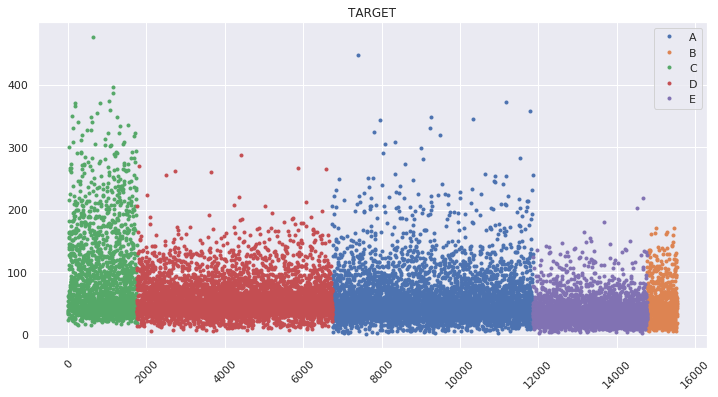

In [0]:
scatter_analysis(train, ['target'])

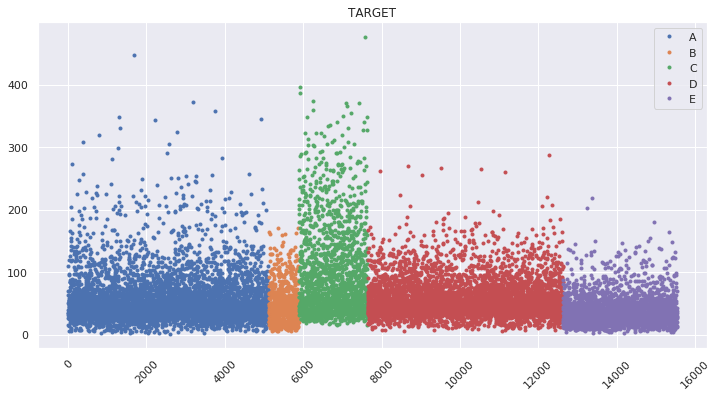

In [0]:
scatter_analysis(train.sort_values(by='location').reset_index(drop=True), ['target'])

In [0]:
from scipy.stats import norm

In [0]:
target = train.target

[]

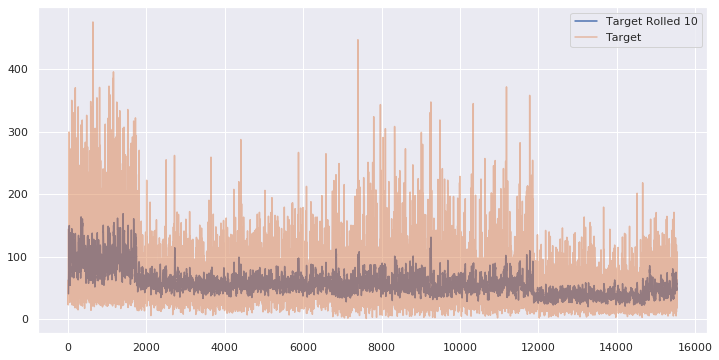

In [0]:
target.rolling(10).mean().plot(label='Target Rolled 10')
target.plot(alpha=0.5, label='Target')

plt.legend()
plt.plot()

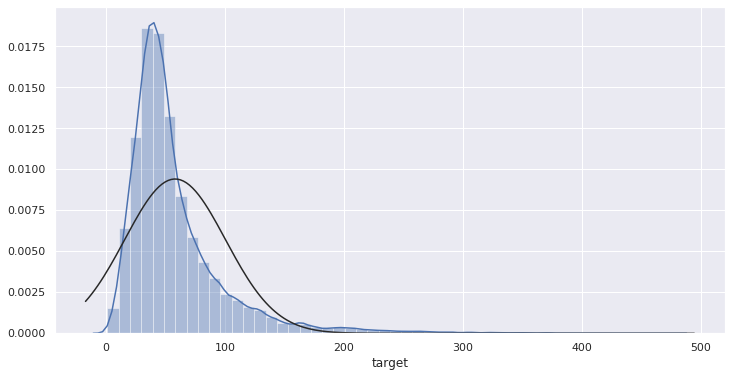

In [0]:
sn.distplot(train.target, fit=norm)

## Missing Value Analysis

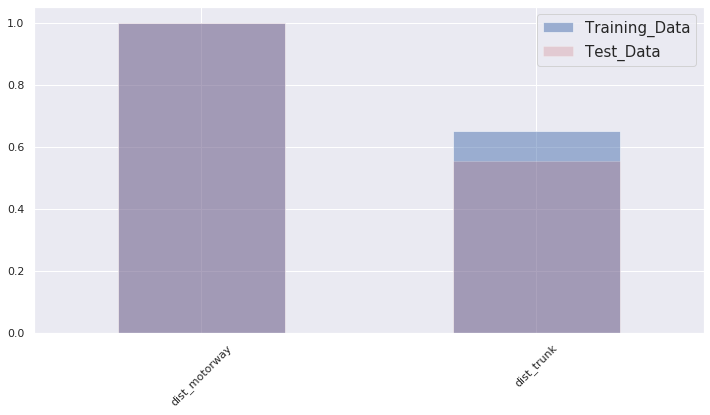

In [0]:
nan_analysis(train, test, threshold=0.35)

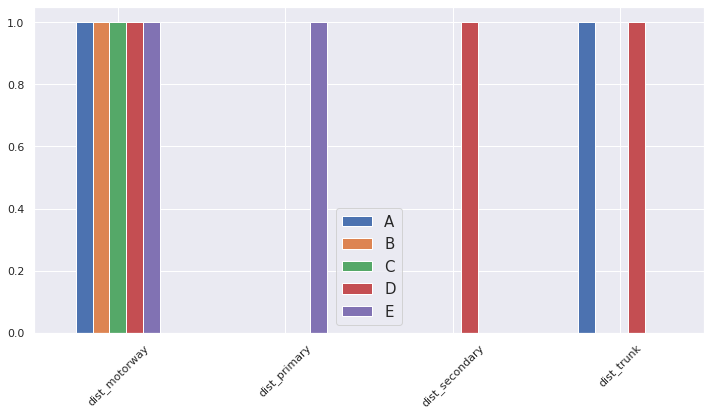

In [0]:
location_nan(train)

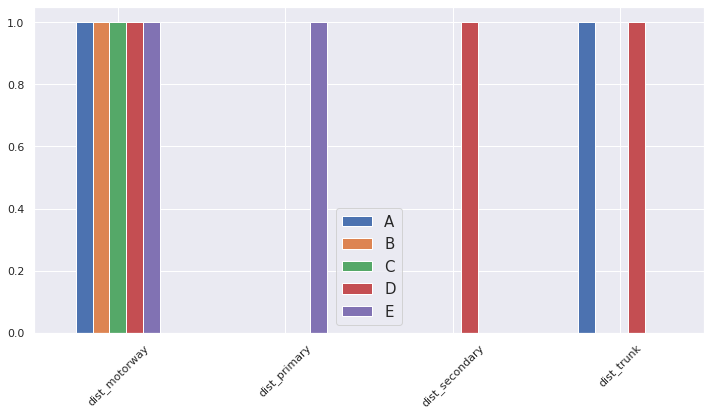

In [0]:
location_nan(test)

In [0]:
# ANALYSIS --> DROPPING 'DIST_MOTORWAY'

train = train.drop('dist_motorway', axis=1)
test = test.drop('dist_motorway', axis=1)

In [0]:
train.dist_trunk.value_counts()

850.423131    2907
32.885520     1753
528.078476     767
Name: dist_trunk, dtype: int64

In [0]:
# ANALYSIS --> DROPPING 'DIST_TRUNK'

train = train.drop('dist_trunk', axis=1)
test = test.drop('dist_trunk', axis=1)

In [0]:
train.dist_secondary.value_counts()

343.595039     5122
1738.872942    2907
12.730489      1753
1144.376412     767
Name: dist_secondary, dtype: int64

In [0]:
# ANALYSIS --> DROPPING 'DIST_SECONDARY' AND 'DIST_PRIMARY'

train = train.drop('dist_secondary', axis=1)
test = test.drop('dist_secondary', axis=1)

train = train.drop('dist_primary', axis=1)
test = test.drop('dist_primary', axis=1)

In [0]:
nan_train = check_nan(train)
nan_train

wind_dir_0        0.112234
wind_spd_0        0.112234
wind_dir_1        0.111333
wind_spd_1        0.111333
wind_dir_2        0.110754
                    ...   
atmos_press_60    0.058498
atmos_press_61    0.058498
atmos_press_59    0.058434
atmos_press_62    0.058434
atmos_press_63    0.058369
Length: 726, dtype: float64

## Informative Analysis

In [0]:
train.describe()

,target,max_temp_0,min_temp_0,mean_temp_0,std_temp_0,var_temp_0,median_temp_0,ptp_temp_0,max_temp_1,min_temp_1,...,km2,aspect,dist_tertiary,dist_unclassified,dist_residential,popn,hh,hh_cook_charcoal,hh_cook_firewood,hh_burn_waste
count,15539.000000,15539.000000,15539.000000,15539.000000,15539.000000,15539.000000,15539.000000,15539.000000,15539.000000,15539.000000,...,15539.000000,15539.000000,15539.000000,15539.000000,15539.000000,15539.000000,15539.000000,15539.000000,15539.000000,15539.000000
mean,58.242429,27.906512,18.733849,22.719441,2.941595,9.798000,22.083026,9.172662,27.899329,18.734520,...,2.407961,145.365384,359.074405,266.625077,89.891771,16000.932492,4036.911062,2764.413476,369.281743,1207.954373
std,42.373700,2.834204,1.326136,1.620057,1.070089,6.104818,1.708251,3.090464,2.835618,1.303652,...,2.380447,47.012066,188.457889,153.315494,115.350186,29463.389296,8214.103958,6624.734738,358.740502,3076.767072
min,1.452619,18.591667,13.783333,17.367361,0.000000,0.000000,16.850000,0.000000,18.541667,13.783333,...,0.800000,90.000000,72.459340,65.142004,1.042809,3596.000000,663.000000,7.000000,26.000000,43.000000
25%,33.482625,26.375000,17.741667,21.530382,2.320565,5.385020,20.808523,7.441667,26.350000,17.783333,...,0.800000,90.000000,137.722087,76.024389,11.601442,3596.000000,663.000000,7.000000,43.000000,99.000000
50%,46.504048,28.058333,18.733333,22.735764,2.979716,8.878705,22.029545,9.291667,27.975000,18.733333,...,1.600000,121.000000,339.693908,330.609776,11.601442,4763.000000,809.000000,508.000000,43.000000,99.000000
75%,68.569062,29.800000,19.600000,23.851563,3.651142,13.330836,23.237500,11.225000,29.775000,19.575000,...,1.900000,194.000000,575.917422,406.967815,254.307415,6064.000000,1297.000000,985.000000,651.000000,142.000000
max,475.820000,35.683333,23.600000,28.382986,5.962962,35.556914,28.491667,17.850000,36.533333,24.416667,...,8.500000,219.800000,575.917422,449.591885,254.307415,97895.000000,26873.000000,21316.000000,1144.000000,9835.000000


In [0]:
low_var = low_variance_features(train, plot=False)
low_var

wind_spd_102        0.498676
wind_spd_109        0.498022
wind_spd_119        0.496132
wind_spd_103        0.495701
wind_spd_120        0.494277
                      ...   
std_atmos_press     0.000446
var_rel_humidity    0.000053
var_atmos_press     0.000042
median_precip       0.000000
min_precip          0.000000
Length: 154, dtype: float64

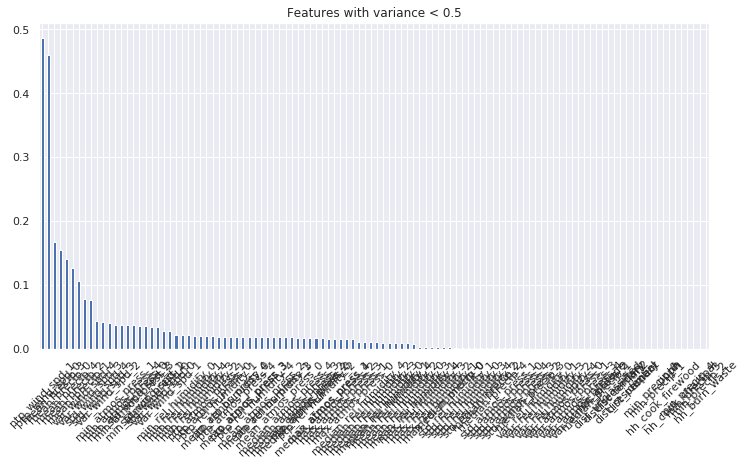

In [0]:
low_var_A = low_variance_features(train_A)

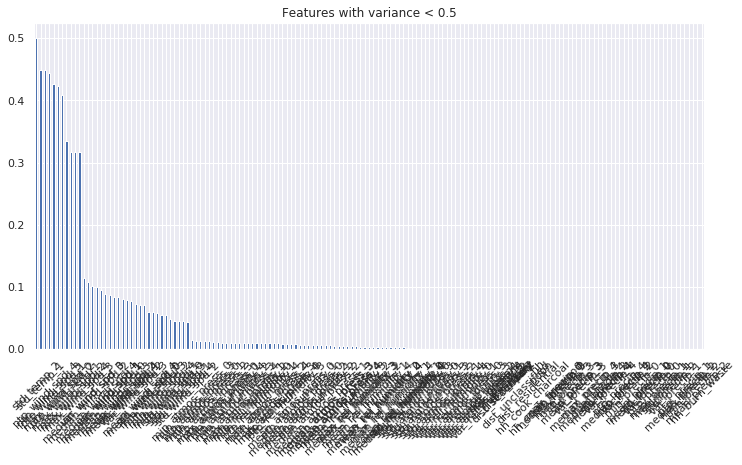

In [0]:
low_var_B = low_variance_features(train_B)

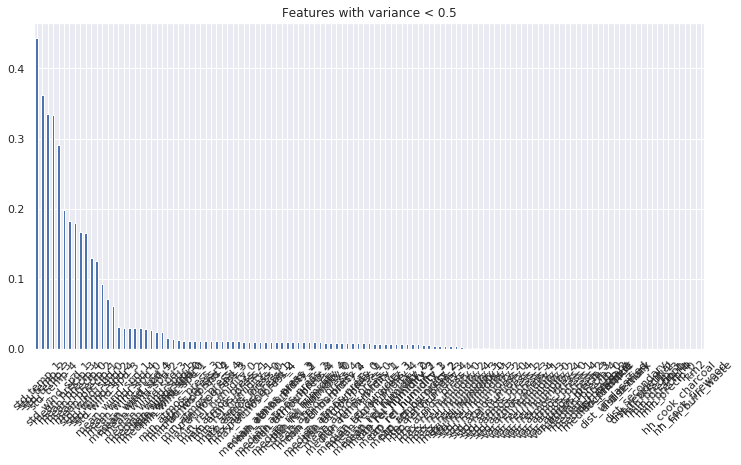

In [0]:
low_var_C = low_variance_features(train_C)

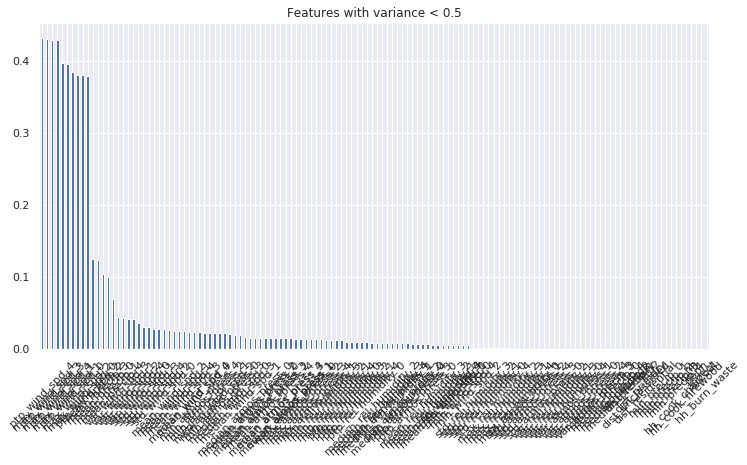

In [0]:
low_var_D = low_variance_features(train_D)

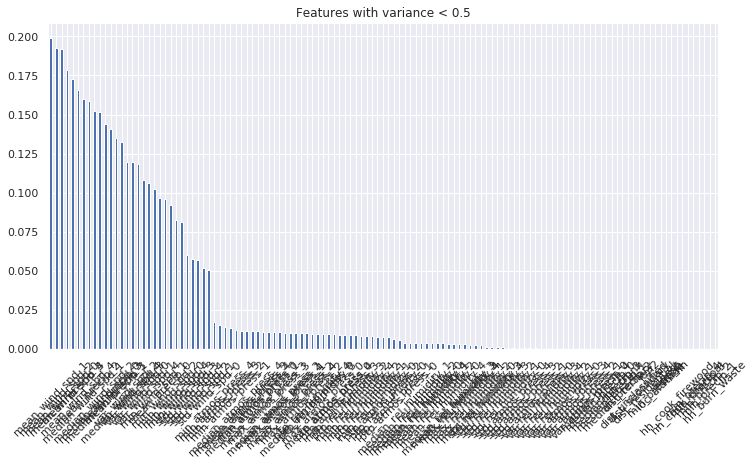

In [0]:
low_var_E = low_variance_features(train_E)

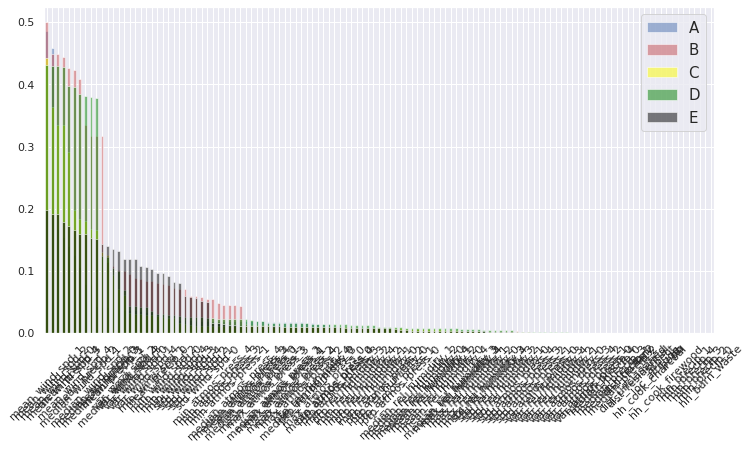

In [0]:
variance_analysis(train)

In [0]:
low_var_A.sort_index()

aspect              0.000000e+00
dist_primary        4.620787e-26
dist_residential    1.583585e-25
dist_secondary      6.200024e-22
dist_tertiary       3.227151e-22
                        ...     
var_wind_spd_0      2.893821e-02
var_wind_spd_1      2.783716e-02
var_wind_spd_2      4.151888e-02
var_wind_spd_3      7.746330e-02
var_wind_spd_4      7.844075e-02
Length: 110, dtype: float64

In [0]:
low_var_B.sort_index()

aspect              9.908390e-25
dist_primary        6.493562e-22
dist_residential    9.557678e-29
dist_secondary      1.863586e-22
dist_tertiary       5.467813e-23
                        ...     
var_wind_spd_0      1.016463e-01
var_wind_spd_1      8.635449e-02
var_wind_spd_2      7.752944e-02
var_wind_spd_3      7.276618e-02
var_wind_spd_4      7.926175e-02
Length: 155, dtype: float64

In [0]:
low_var_C.sort_index()

aspect                3.104991e-23
dist_primary          2.802101e-20
dist_residential      2.085329e-25
dist_secondary        2.217175e-25
dist_tertiary         1.980426e-24
                          ...     
var_rel_humidity_0    4.159843e-05
var_rel_humidity_1    4.410383e-05
var_rel_humidity_2    3.883876e-05
var_rel_humidity_3    4.232749e-05
var_rel_humidity_4    3.718761e-05
Length: 123, dtype: float64

In [0]:
low_var_D.sort_index()

aspect               0.000000e+00
dist_primary         2.502723e-23
dist_residential     1.240745e-24
dist_tertiary        1.493910e-22
dist_unclassified    4.200076e-23
                         ...     
var_wind_spd_0       3.615775e-02
var_wind_spd_1       4.299112e-02
var_wind_spd_2       4.166054e-02
var_wind_spd_3       4.403403e-02
var_wind_spd_4       4.160719e-02
Length: 132, dtype: float64

In [0]:
low_var_E.sort_index()

aspect              0.000000e+00
dist_residential    1.303035e-26
dist_secondary      1.675617e-23
dist_tertiary       3.666140e-23
dist_trunk          1.987985e-22
                        ...     
var_wind_spd_0      1.186318e-01
var_wind_spd_1      1.079536e-01
var_wind_spd_2      1.198518e-01
var_wind_spd_3      1.194162e-01
var_wind_spd_4      1.063746e-01
Length: 123, dtype: float64

In [0]:
low_var.sort_values()

min_precip_2         0.000000
min_precip_0         0.000000
min_precip_3         0.000000
min_precip_1         0.000000
min_precip_4         0.000000
                       ...   
median_wind_spd_2    0.406120
median_wind_spd_1    0.408208
mean_wind_spd_3      0.410416
mean_wind_spd_2      0.412794
mean_wind_spd_1      0.412836
Length: 89, dtype: float64

In [0]:
LOW_VARIANCE_COLS = ['median_precip', 'min_precip',
                     'max_rel_humidity', 'mean_rel_humidity', 'var_atmos_press',
                     'var_rel_humidity', 'ptp_rel_humidity', 'std_rel_humidity',
                     'std_atmos_press']

In [0]:
train.aspect.describe()

count    15539.000000
mean       145.365384
std         47.012066
min         90.000000
25%         90.000000
50%        121.000000
75%        194.000000
max        219.800000
Name: aspect, dtype: float64

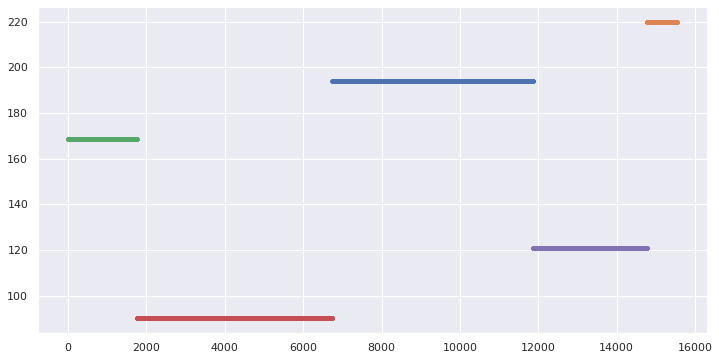

In [0]:
train_A.aspect.plot(style='.')
train_B.aspect.plot(style='.')
train_C.aspect.plot(style='.')
train_D.aspect.plot(style='.')
train_E.aspect.plot(style='.')

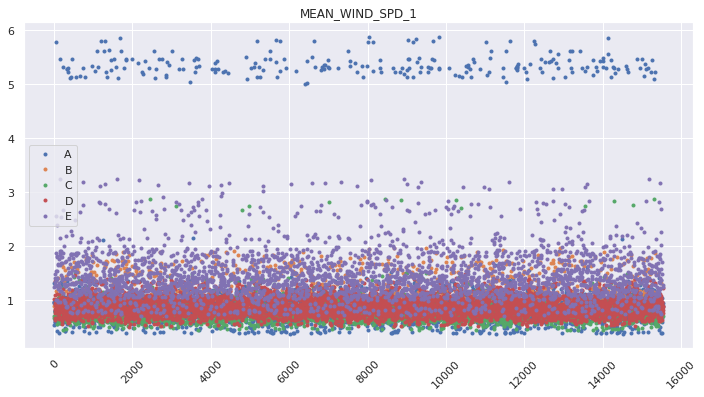

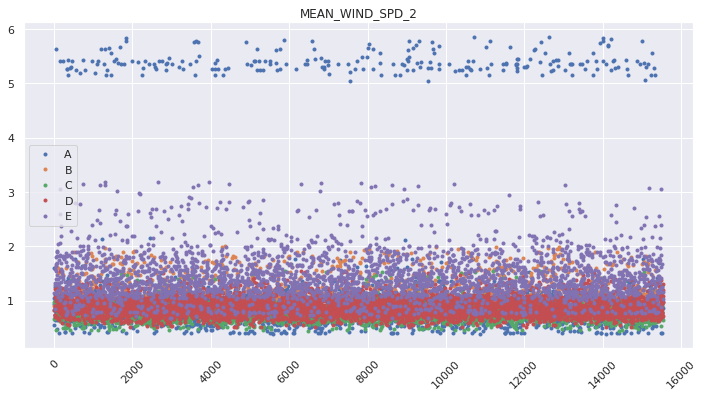

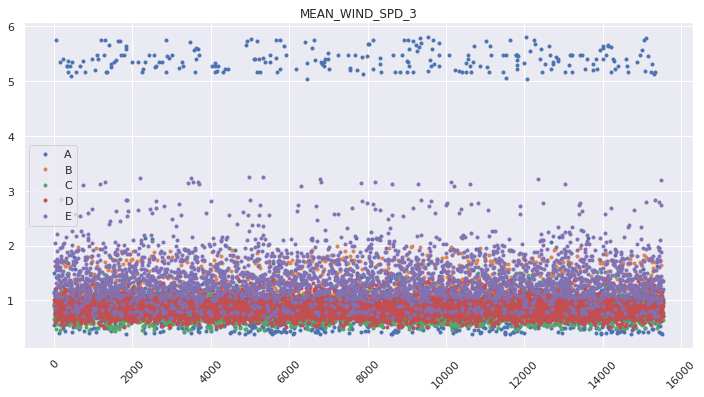

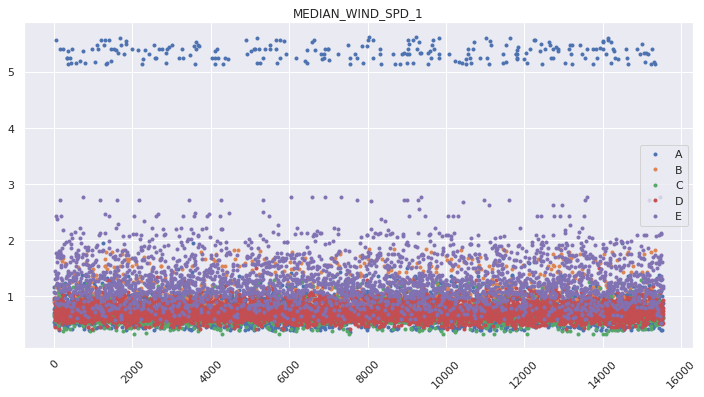

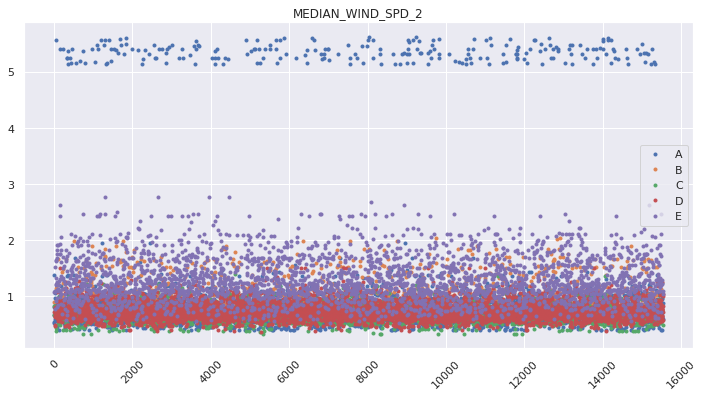

...

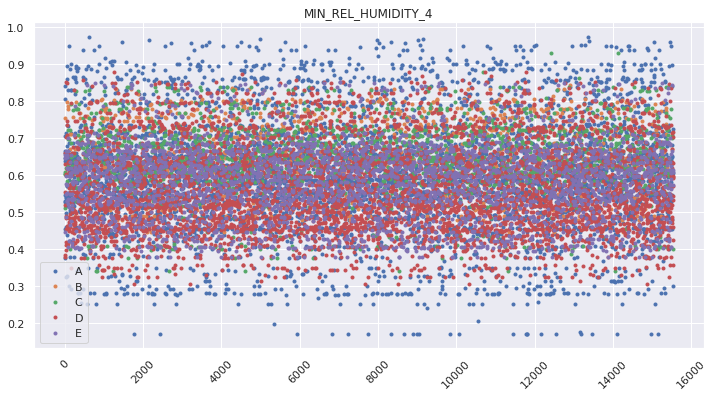

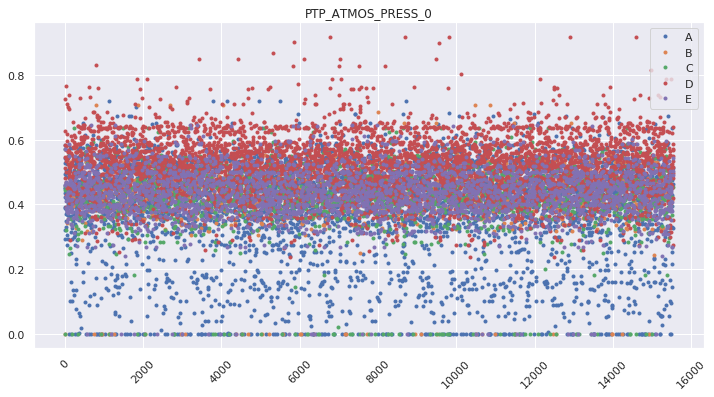

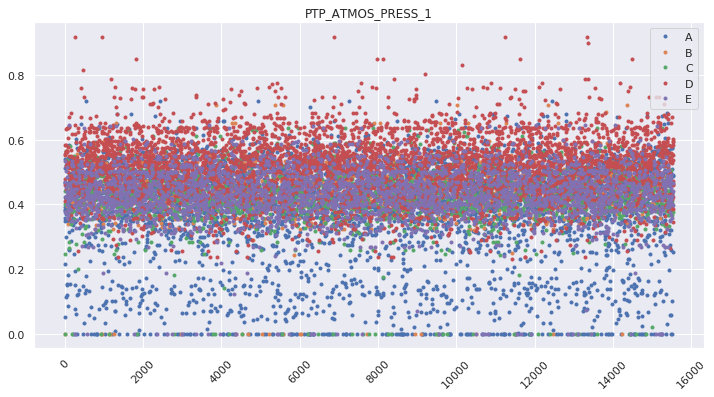

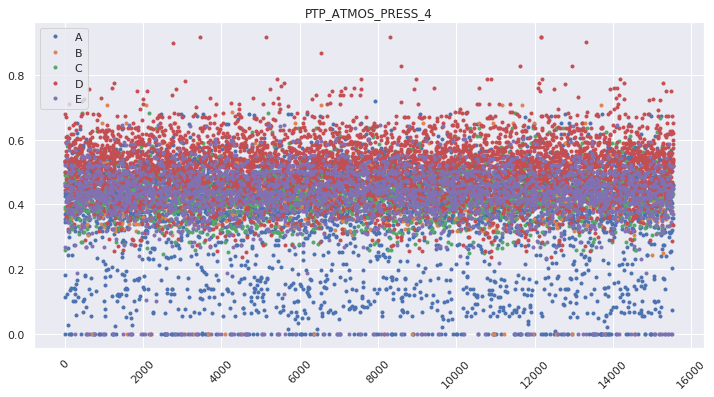

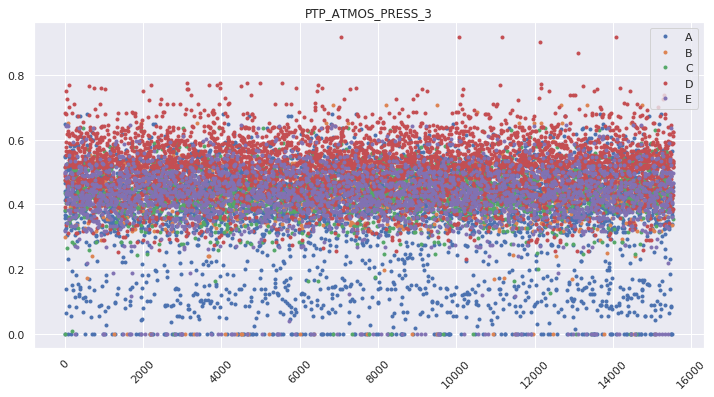

KeyboardInterrupt: 

In [0]:
scatter_analysis(train, low_var.index)

In [0]:
train

,ID,location,target,max_temp,min_temp,mean_temp,std_temp,var_temp,median_temp,ptp_temp,...,km2,aspect,dist_tertiary,dist_unclassified,dist_residential,popn,hh,hh_cook_charcoal,hh_cook_firewood,hh_burn_waste
0,ID_train_2339,A,36.596585,27.308333,18.708333,22.494749,2.788876,7.777827,21.833333,8.600000,...,1.9,194.0,575.917422,330.609776,254.307415,4763,809,508,43,142
1,ID_train_6957,B,38.702195,28.008333,17.945455,22.617268,2.714877,7.370555,21.750000,10.062879,...,5.4,219.8,531.103271,65.142004,1.042809,22243,5735,116,1144,239
2,ID_train_6860,A,60.076744,32.175000,17.308333,23.564200,3.699033,13.682844,22.908333,14.866667,...,1.9,194.0,575.917422,330.609776,254.307415,4763,809,508,43,142
3,ID_train_15324,D,33.028043,32.475000,17.241667,23.736364,3.906744,15.262650,22.241667,15.233333,...,0.8,90.0,339.693908,76.024389,11.601442,3596,663,7,651,99
4,ID_train_951,A,14.172444,30.016667,18.158333,22.723372,3.218939,10.361571,21.450000,11.858333,...,1.9,194.0,575.917422,330.609776,254.307415,4763,809,508,43,142
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15534,ID_train_15030,C,33.803556,27.258333,17.325000,21.785199,2.644531,6.993545,21.325000,9.933333,...,8.5,168.7,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
15535,ID_train_6540,D,109.275217,32.533333,17.758333,24.161915,4.169487,17.384620,23.191667,14.775000,...,0.8,90.0,339.693908,76.024389,11.601442,3596,663,7,651,99
15536,ID_train_13182,D,73.544651,31.025000,17.266667,23.562879,3.668514,13.457998,23.091667,13.758333,...,0.8,90.0,339.693908,76.024389,11.601442,3596,663,7,651,99
15537,ID_train_9840,D,50.410000,30.725000,16.325000,22.107851,3.458674,11.962428,21.500000,14.400000,...,0.8,90.0,339.693908,76.024389,11.601442,3596,663,7,651,99


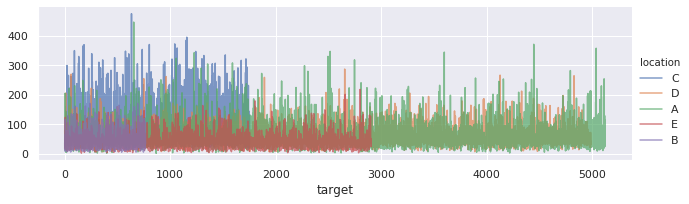

In [0]:
trend_analysys(train, 'target')

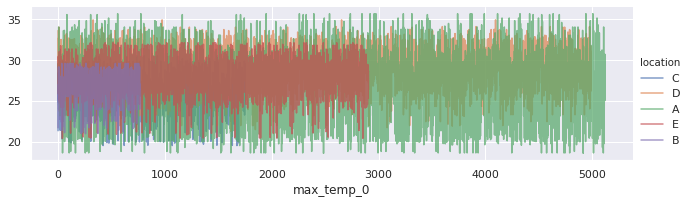

In [0]:
trend_analysys(train, 'max_temp_0')

## Categorical Analysis

In [0]:
cat_cols = train.select_dtypes(['object']).columns
cat_cols

Index(['ID', 'location'], dtype='object')

In [0]:
all_data = train.append(test)

In [0]:
encoded_id, uniques_id = pd.factorize(all_data.ID)

In [0]:
encoded_id.shape

(20574,)

In [0]:
train_size, test_size = train.shape[0], test.shape[0]
train_size, test_size

(15539, 5035)

In [0]:
train.ID = encoded_id[:train_size]
test.ID = encoded_id[train_size : train_size + test_size] 

In [0]:
train

,ID,location,target,temp_0,precip_0,humidity_0,wind_dir_0,wind_spd_0,atmos_press_0,temp_1,...,km2,aspect,dist_tertiary,dist_unclassified,dist_residential,popn,hh,hh_cook_charcoal,hh_cook_firewood,hh_burn_waste
0,0,C,45.126304,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,8.5,168.7,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
1,1,C,53.100000,21.866667,0.0,0.548333,334.082716,1.152500,87.736667,21.383333,...,8.5,168.7,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
2,2,C,23.215250,24.550000,0.0,0.751417,177.141726,1.028333,87.605000,24.875000,...,8.5,168.7,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
3,3,C,37.308333,22.925000,0.0,0.449167,330.749248,1.559167,87.921667,23.600000,...,8.5,168.7,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
4,4,C,61.786522,22.208333,0.0,0.884417,181.917358,0.829167,87.562500,23.775000,...,8.5,168.7,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15534,15534,B,45.900732,23.050000,0.0,0.802500,27.238081,0.795000,88.273333,23.300000,...,5.4,219.8,531.103271,65.142004,1.042809,22243,5735,116,1144,239
15535,15535,B,42.629762,21.133333,0.0,0.922333,357.291651,0.326667,88.382500,21.091667,...,5.4,219.8,531.103271,65.142004,1.042809,22243,5735,116,1144,239
15536,15536,B,108.219024,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,5.4,219.8,531.103271,65.142004,1.042809,22243,5735,116,1144,239
15537,15537,B,50.928837,19.900000,0.0,0.901667,8.809323,0.343333,88.525833,19.725000,...,5.4,219.8,531.103271,65.142004,1.042809,22243,5735,116,1144,239


In [0]:
test

,ID,location,temp_0,precip_0,humidity_0,wind_dir_0,wind_spd_0,atmos_press_0,temp_1,precip_1,...,km2,aspect,dist_tertiary,dist_unclassified,dist_residential,popn,hh,hh_cook_charcoal,hh_cook_firewood,hh_burn_waste
0,15539,C,23.966667,0.0,0.689833,290.135238,0.633333,87.643333,22.883333,0.0,...,8.5,168.7,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
1,15540,C,18.991667,0.0,0.999750,295.235054,0.640833,87.892500,19.708333,0.0,...,8.5,168.7,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
2,15541,C,18.716667,0.0,0.951417,310.750906,0.745000,87.988333,20.608333,0.0,...,8.5,168.7,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
3,15542,C,27.066667,0.0,0.580000,311.655413,0.937500,87.716667,26.800000,0.0,...,8.5,168.7,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
4,15543,C,26.400000,0.0,0.682250,333.754601,1.235000,87.598333,26.958333,0.0,...,8.5,168.7,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5030,20569,B,26.175000,0.0,0.752500,133.270890,2.004167,88.261667,25.258333,0.0,...,5.4,219.8,531.103271,65.142004,1.042809,22243,5735,116,1144,239
5031,20570,B,27.691667,0.0,0.751667,155.247761,2.988333,88.555000,27.800000,0.0,...,5.4,219.8,531.103271,65.142004,1.042809,22243,5735,116,1144,239
5032,20571,B,22.883333,0.0,0.816667,297.524013,2.064167,88.355000,22.672727,0.0,...,5.4,219.8,531.103271,65.142004,1.042809,22243,5735,116,1144,239
5033,20572,B,22.591667,0.0,0.906667,355.359448,0.356667,88.531667,22.518182,0.0,...,5.4,219.8,531.103271,65.142004,1.042809,22243,5735,116,1144,239


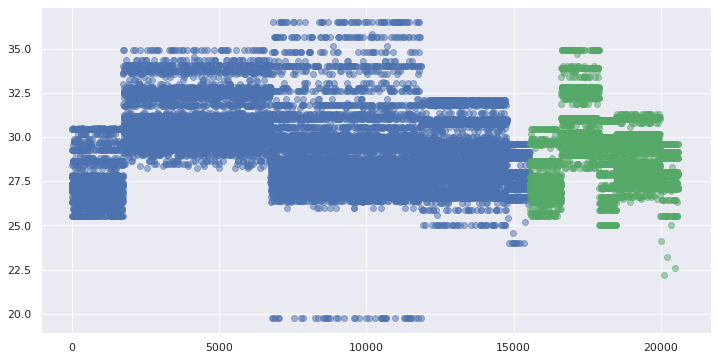

In [0]:
col = 'max_temp'

plt.scatter(train.ID, train[col], c='b', alpha=0.5)
plt.scatter(test.ID, test[col], c='g', alpha=0.5)

In [0]:
from sklearn.preprocessing import LabelEncoder

In [0]:
le = LabelEncoder().fit(all_data.location)

In [0]:
train.location = le.transform(train.location)
#valid.location = le.transform(valid.location)
test.location = le.transform(test.location)

## Outilier Analysis

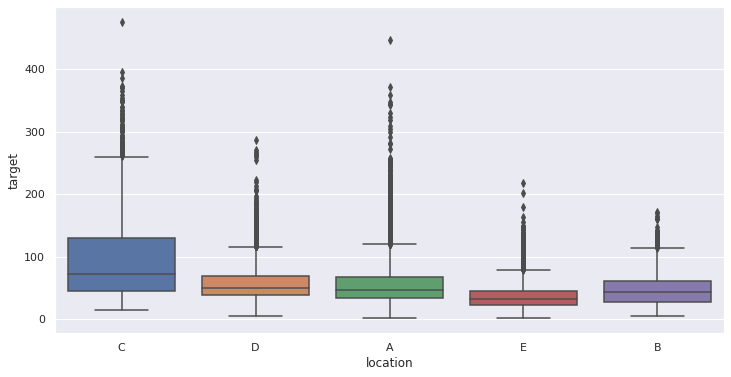

In [0]:
sn.boxplot(x='location', y='target', data=train)

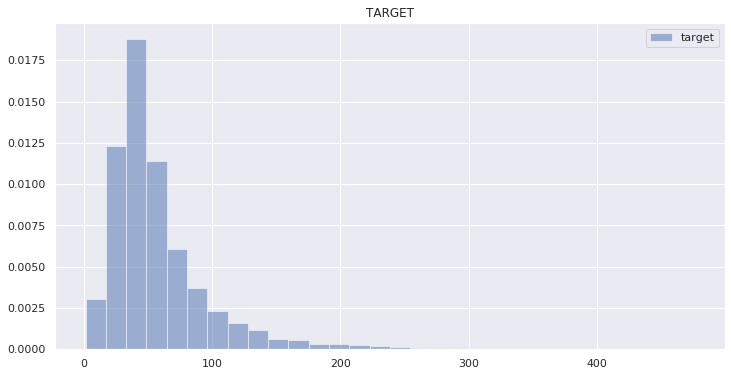

In [0]:
histogram_analysis(train, ['target'])

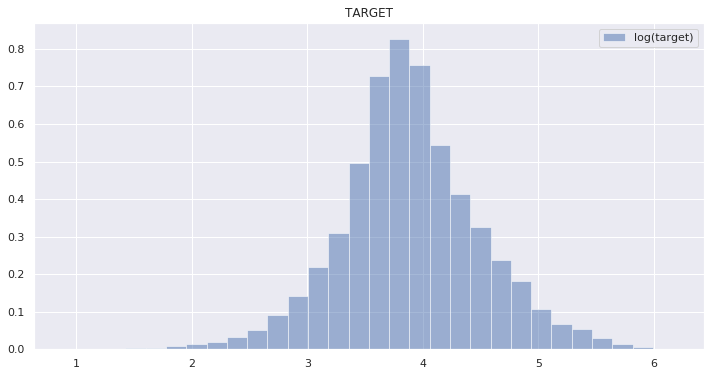

In [0]:
histogram_analysis(train, ['target'], log=True)

In [0]:
df_skew = train.skew().sort_values(ascending=False)

In [0]:
threshold = 2
skew_feat = df_skew[abs(df_skew) > threshold]
skew_feat

precip_43       16.987148
precip_42       16.477301
precip_113      16.433801
precip_29       16.290827
precip_71       16.111850
                  ...    
wind_spd_113     2.305563
mean_precip      2.277462
std_wind_spd     2.218895
ptp_wind_dir    -6.709942
max_wind_dir    -7.497131
Length: 259, dtype: float64

In [0]:
skew_feat_cols = skew_feat.index

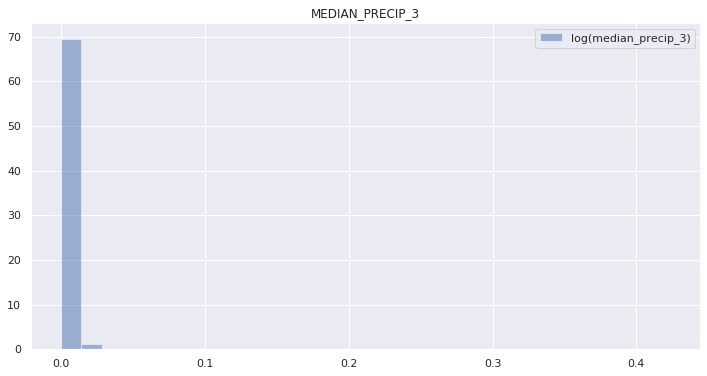

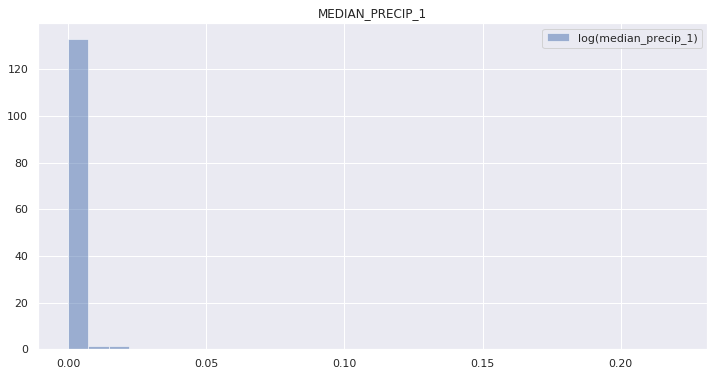

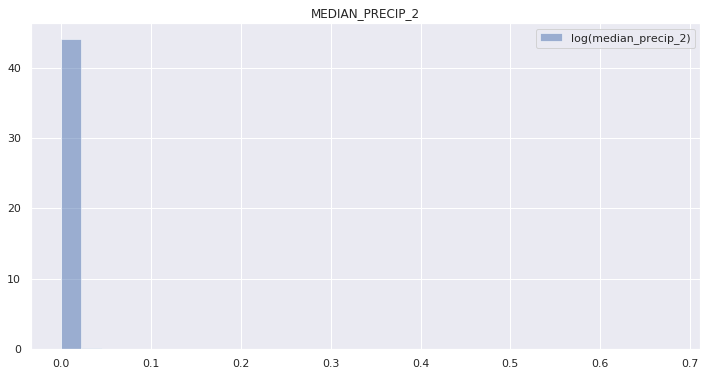

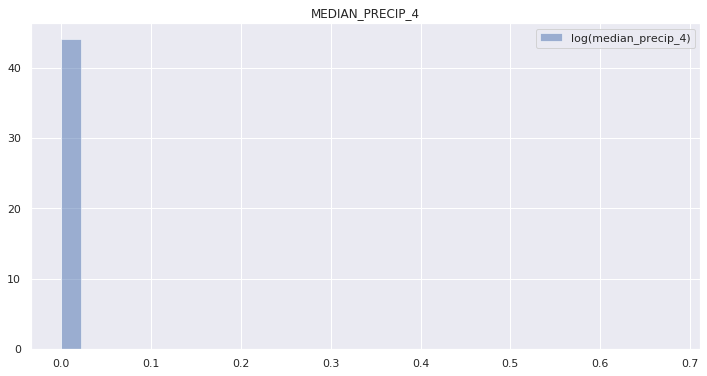

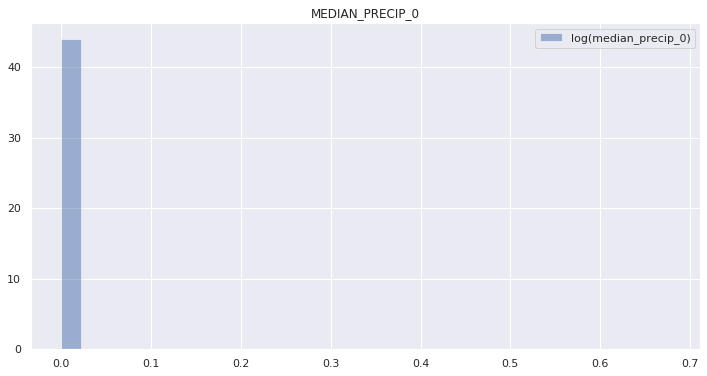

...

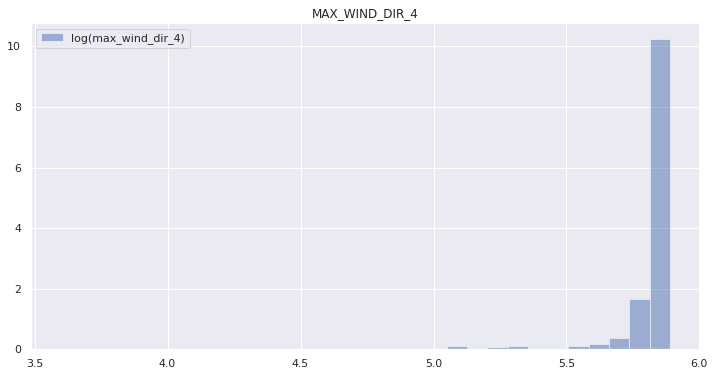

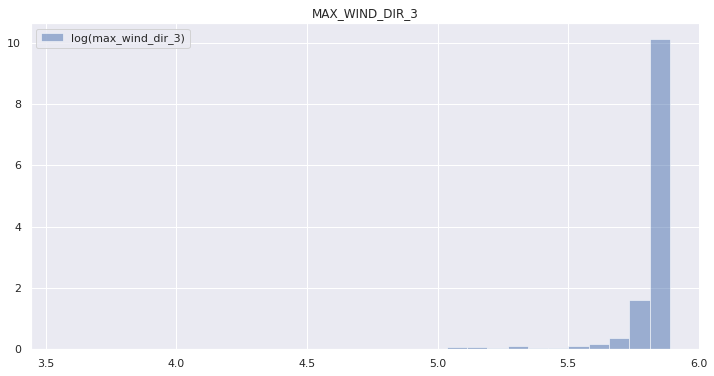

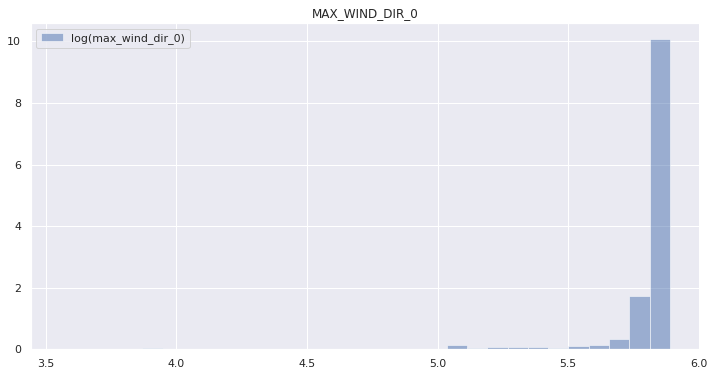

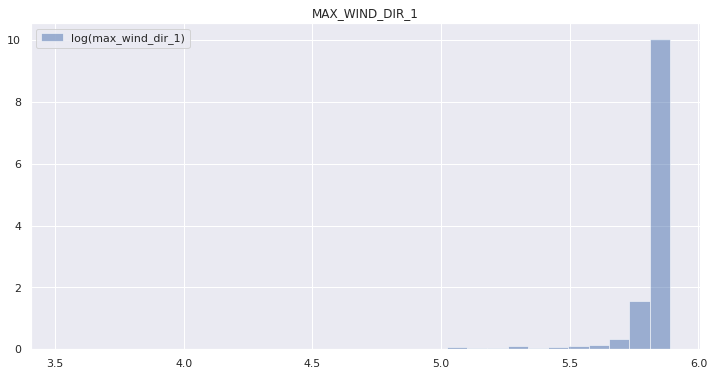

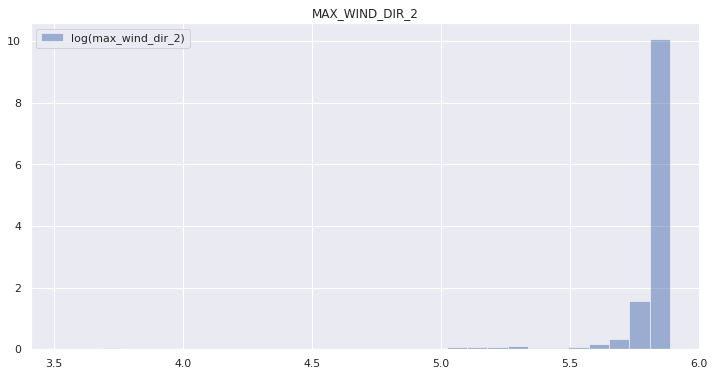

In [0]:
histogram_analysis(train, skew_feat, log=True)

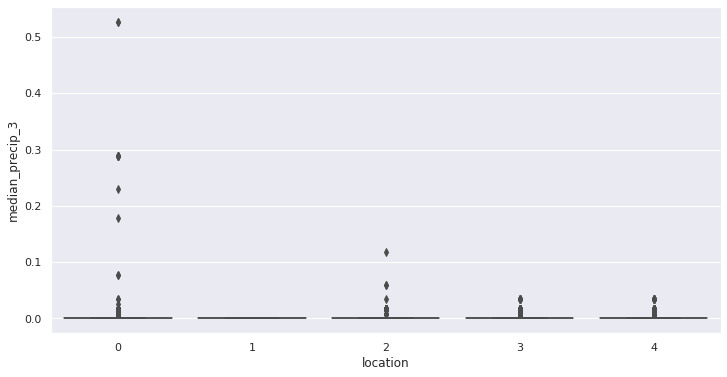

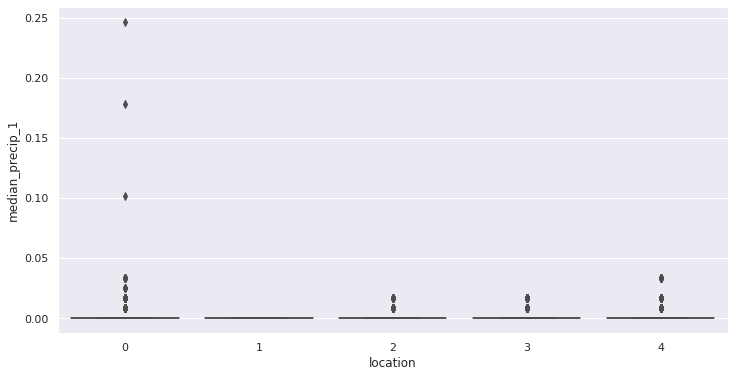

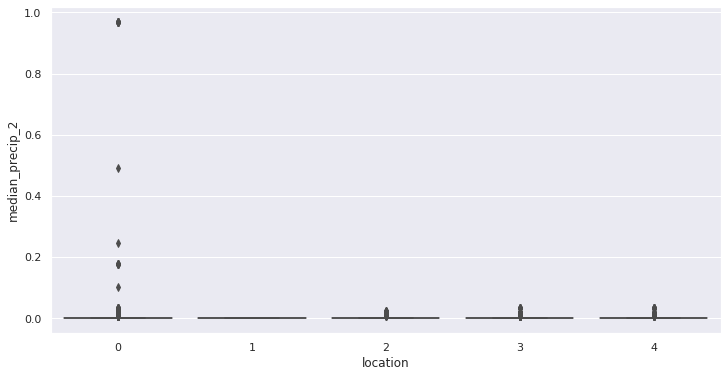

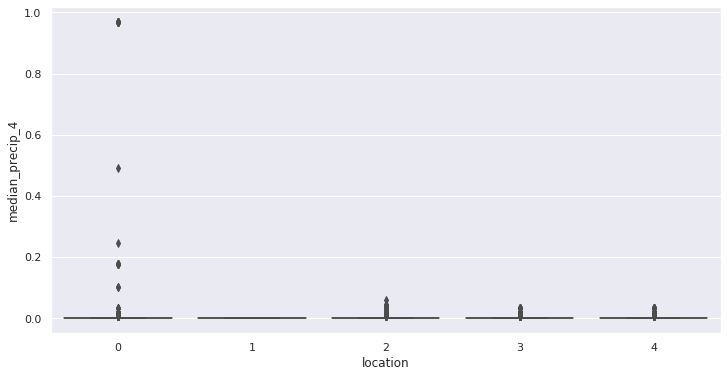

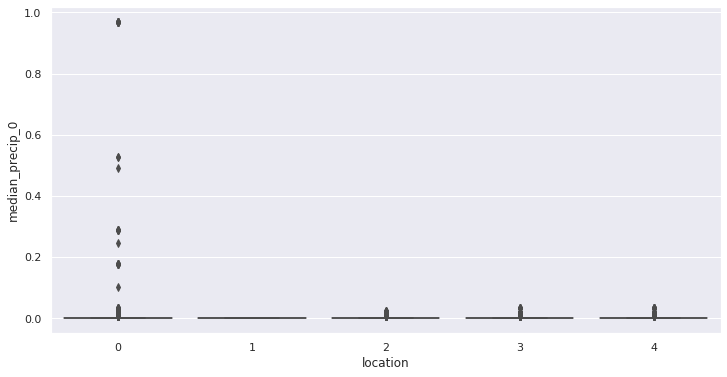

...

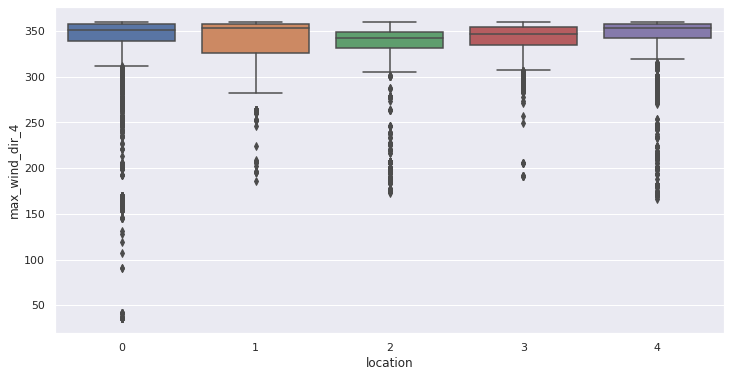

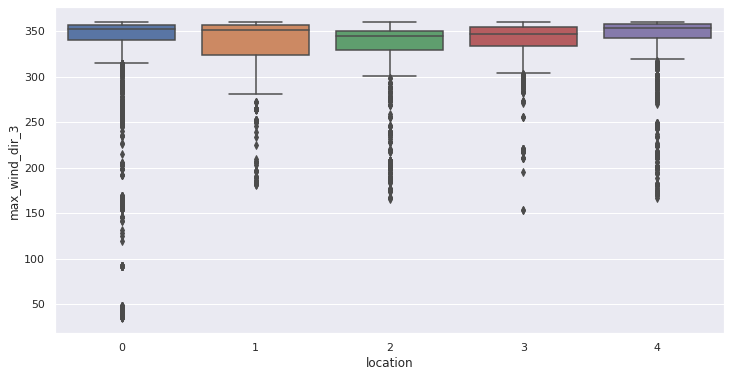

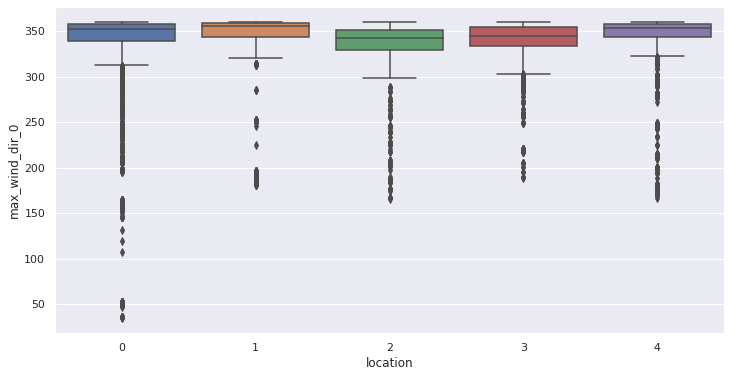

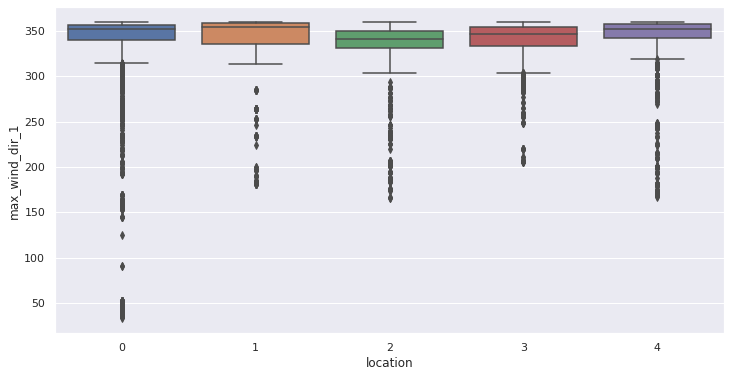

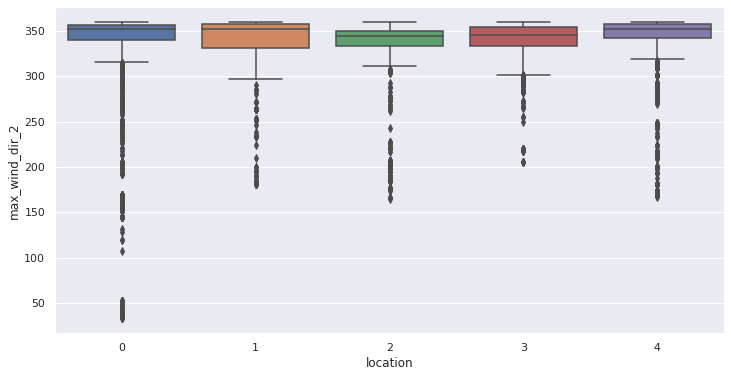

In [0]:
boxplot_analysis(train, skew_feat)

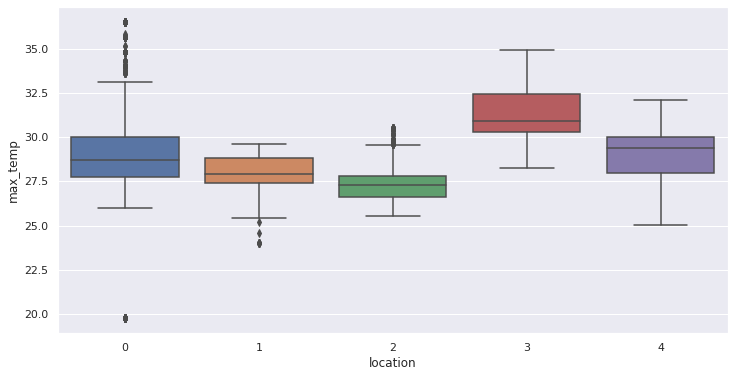

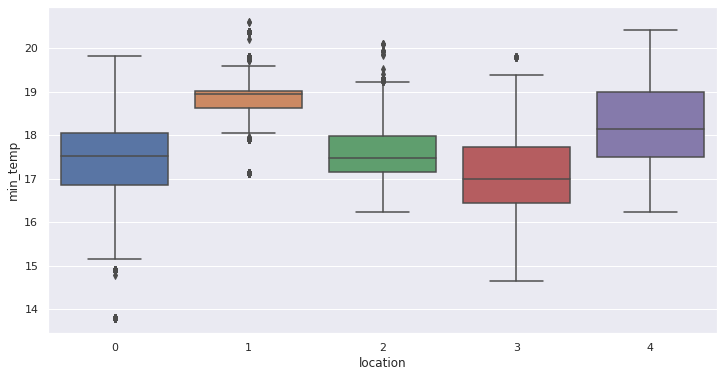

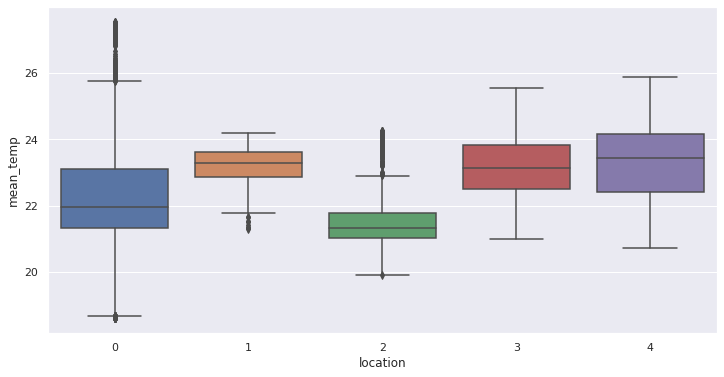

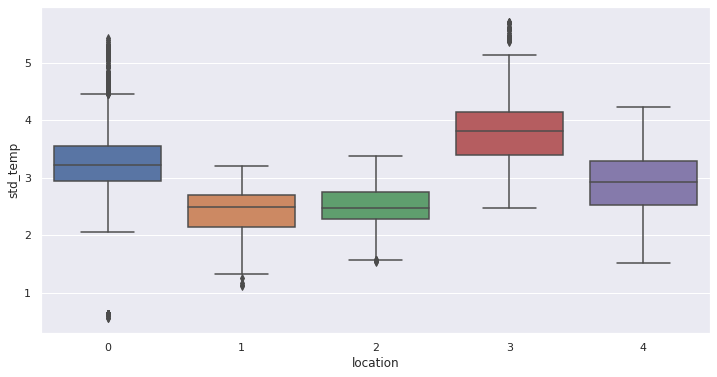

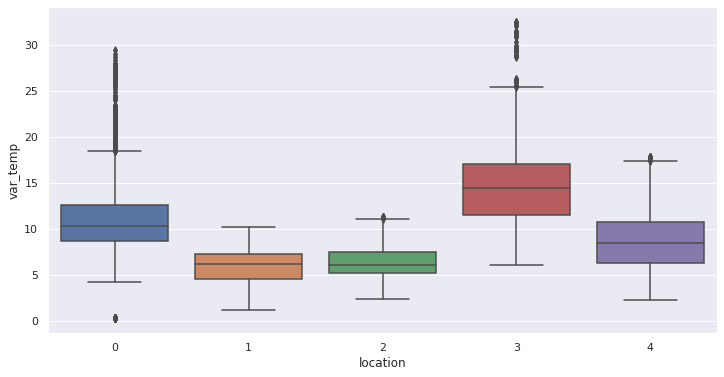

...

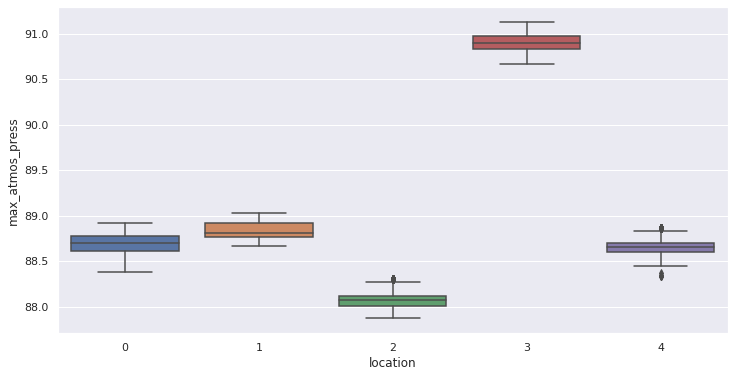

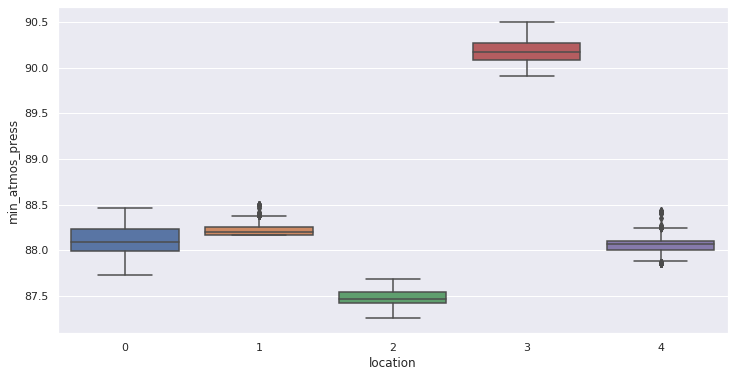

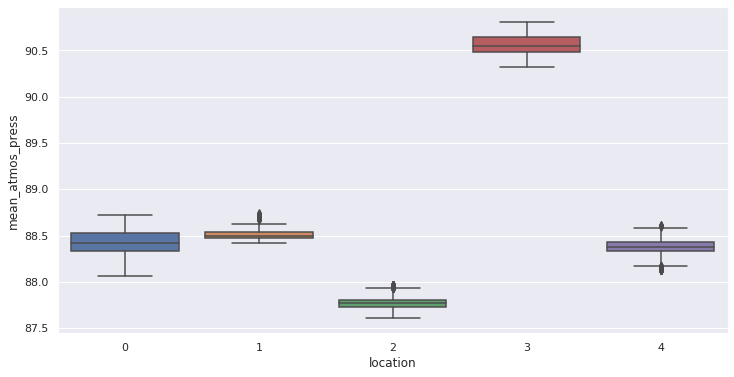

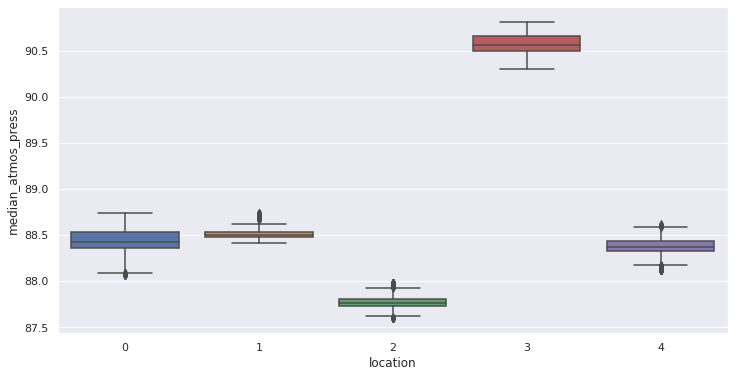

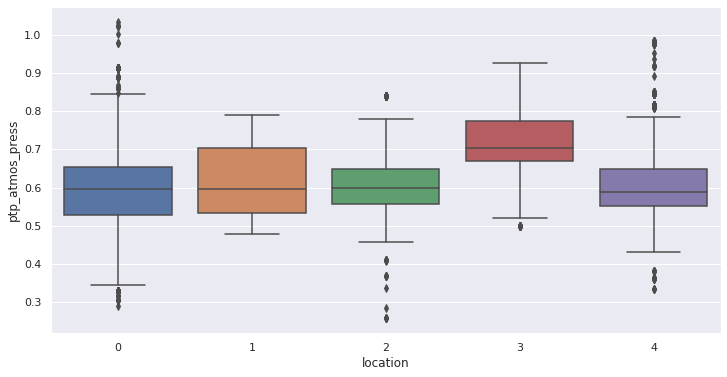

In [0]:
boxplot_analysis(train, SENSORS_COLS)

# Feature Engineering

## From Nan Analysis

In [0]:
train = train.drop('dist_motorway', axis=1)
test = test.drop('dist_motorway', axis=1)

train = train.drop('dist_trunk', axis=1)
test = test.drop('dist_trunk', axis=1)

train = train.drop('dist_secondary', axis=1)
test = test.drop('dist_secondary', axis=1)

train = train.drop('dist_primary', axis=1)
test = test.drop('dist_primary', axis=1)

## From Categorical Analysis

In [0]:
from sklearn.preprocessing import LabelEncoder

In [0]:
all_data = train.append(test)

In [0]:
encoded_id, uniques_id = pd.factorize(all_data.ID)

train_size, test_size = train.shape[0], test.shape[0]

train.ID = encoded_id[:train_size]
test.ID = encoded_id[train_size:] 

In [0]:
le = LabelEncoder().fit(all_data.location)

train.location = le.transform(train.location)
test.location = le.transform(test.location)

# Preprocessing

In [0]:
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, KFold

In [0]:
 # STANDARD SCALING

def standard_scaling(data_x, data_y, test):

    all_data = data_x.append(test)

    std_scaler = StandardScaler().fit(all_data)

    train_x = std_scaler.transform(data_x)
    test_x = std_scaler.transform(test)

    y_scaler = StandardScaler().fit(data_y.values.reshape(-1,1))
    train_y = y_scaler.transform(data_y.values.reshape(-1,1))
    
    return train_x, train_y, test_x, y_scaler

def inverse_std_scaling(prediction, y_scaler):
    return y_scaler.inverse_transform(prediction.reshape(-1,1))

 # ROBUST SCALING

def robust_scaling(data_x, data_y, test, a, b):
    
    all_data = data_x.append(test)

    rob_scaler = RobustScaler(quantile_range=(a,b)).fit(all_data)

    train_x = rob_scaler.transform(data_x)
    test_x = rob_scaler.transform(test)

    y_scaler = RobustScaler().fit(data_y.values.reshape(-1,1))
    train_y = y_scaler.transform(data_y.values.reshape(-1,1))
    
    return train_x, train_y, test_x, y_scaler

def inverse_robust_scaling(prediction, y_scaler):
    return y_scaler.inverse_transform(prediction.reshape(-1,1))

In [0]:
def split_data(data_x, data_y):
    x_data = data_x.copy()
    y_data = data_y.copy()

    split=0.8
    size = int(len(data_x)*split)

    x_train, y_train = x_data[:size], y_data[:size]

    x_valid, y_valid = x_data[size:], y_data[size:]

    print((x_train.shape, y_train.shape), (x_valid.shape, y_valid.shape))
    
    return x_train, y_train, x_valid, y_valid

In [0]:
def check_skew(feature, threshold=2):
    
    skew = abs(feature.skew())
    
    if(skew > threshold):
        return True
    else:
        return False
    
def fillna_features(data):
    
    for col in data.columns:
        
        # FILLING NAN WITH MEDIAN 
        if(check_skew):
            data[col] = data[col].fillna(data[col].median())
            
        # FILLING NAN WITH MEAN
        else:
            data[col] = data[col].fillna(data[col].mean())
        
    return data

In [0]:
def RMSE(y, y_pred):
    
    return np.sqrt(mean_squared_error(y, y_pred))

def grid_search_cv(model, parameters, x_train, y_train, k_fold=10, verbose=0, n_jobs=1):
    
    result = GridSearchCV(model, parameters, cv=KFold(k_fold),
                                   scoring='neg_root_mean_squared_error',
                                     verbose=verbose,
                                         n_jobs=n_jobs).fit(x_train, y_train)
    print(result.best_estimator_)
    
    return result

def test_evaluation(model, x_test, y_test):
    print('------- Test Evaluation -------\n')
    y_pred = model.predict(x_test)

    r2 = r2_score(y_test, y_pred)
    rmse = RMSE(y_test, y_pred)
    
    print('R2:\t{:.5f}'.format(r2))
    print('RMSE:\t{:.5f}'.format(rmse))

    x = range(0, len(y_test))
    plt.scatter(x, y_test, label='True', alpha=0.7)
    plt.scatter(x, y_pred, label='Pred', alpha=0.7)
    plt.legend()
    plt.show()
    
    return r2, rmse

## Data

Without ID Feature

In [0]:
train_data_x = train.drop(['ID', 'target'], axis=1)
train_data_y = train.target

test_data_x = test.drop(['ID'], axis=1)

With ID Feature

In [0]:
train_data_x = train.drop(['target'], axis=1)
train_data_y = train.target

test_data_x = test

### Feature Importance

In [0]:
x_train = train[feat_imp_cols]
y_train = train.target

x_test = test[feat_imp_cols]

In [0]:
models_dict = {'Model':[],
               'R2':[],
               'RMSE':[]}

In [0]:
def RMSE(y, y_pred):
    
    return np.sqrt(mean_squared_error(y, y_pred))

def grid_search_cv(model, parameters, x_train, y_train, k_fold=10, verbose=0, n_jobs=1):
    
    result = GridSearchCV(model, parameters, cv=KFold(k_fold),
                                   scoring='neg_root_mean_squared_error',
                                     verbose=verbose,
                                         n_jobs=n_jobs).fit(x_train, y_train)
    print(result.best_estimator_)
    
    return result

def test_evaluation(model, x_test, y_test):
    print('------- Test Evaluation -------\n')
    y_pred = model.predict(x_test)

    r2 = r2_score(y_test, y_pred)
    rmse = RMSE(y_test, y_pred)
    
    print('R2:\t{:.5f}'.format(r2))
    print('RMSE:\t{:.5f}'.format(rmse))

    x = range(0, len(y_test))
    plt.scatter(x, y_test, label='True')
    plt.scatter(x, y_pred, label='Pred')
    plt.legend()
    plt.show()
    
    return r2, rmse

# Non-tree based Models

In [0]:
train_data_x

,location,temp_0,precip_0,humidity_0,wind_dir_0,wind_spd_0,atmos_press_0,temp_1,precip_1,humidity_1,...,km2,aspect,dist_tertiary,dist_unclassified,dist_residential,popn,hh,hh_cook_charcoal,hh_cook_firewood,hh_burn_waste
0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,8.5,168.7,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
1,2,21.866667,0.0,0.548333,334.082716,1.152500,87.736667,21.383333,0.0,0.571667,...,8.5,168.7,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
2,2,24.550000,0.0,0.751417,177.141726,1.028333,87.605000,24.875000,0.0,0.736417,...,8.5,168.7,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
3,2,22.925000,0.0,0.449167,330.749248,1.559167,87.921667,23.600000,0.0,0.446667,...,8.5,168.7,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
4,2,22.208333,0.0,0.884417,181.917358,0.829167,87.562500,23.775000,0.0,0.797667,...,8.5,168.7,72.459340,406.967815,13.931350,97895,26873,21316,751,9835
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15534,1,23.050000,0.0,0.802500,27.238081,0.795000,88.273333,23.300000,0.0,0.795000,...,5.4,219.8,531.103271,65.142004,1.042809,22243,5735,116,1144,239
15535,1,21.133333,0.0,0.922333,357.291651,0.326667,88.382500,21.091667,0.0,0.919167,...,5.4,219.8,531.103271,65.142004,1.042809,22243,5735,116,1144,239
15536,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,5.4,219.8,531.103271,65.142004,1.042809,22243,5735,116,1144,239
15537,1,19.900000,0.0,0.901667,8.809323,0.343333,88.525833,19.725000,0.0,0.909167,...,5.4,219.8,531.103271,65.142004,1.042809,22243,5735,116,1144,239


## Preprocessing

Without ID Feature

In [0]:
train_data_x = train.drop(['ID', 'target'], axis=1)
train_data_y = train.target

test_data_x = test.drop(['ID'], axis=1)

With ID Feature

In [0]:
train_data_x = train.drop(['target'], axis=1)
train_data_y = train.target

test_data_x = test

### Filling NaNs

In [0]:
all_data = train_data_x.append(test_data_x)
all_data = fillna_features(all_data)

train_size, test_size = train_data_x.shape[0], test_data_x.shape[0]


train_data_x, test_data_x = all_data.iloc[:train_size], all_data.iloc[train_size:]

### Scaling

Standard Scaling

In [0]:
train_x_scaled, train_y_scaled, test_x_scaled, y_std_scaler = standard_scaling(train_data_x,
                                                                               train_data_y,
                                                                               test_data_x)

Robust Scaling

In [0]:
a, b = 5, 95

train_x_scaled, train_y_scaled, test_x_scaled, y_rob_scaler = robust_scaling(train_data_x,
                                                                               train_data_y,
                                                                               test_data_x,
                                                                               a, b)

### Split Data

In [0]:
x_train, y_train, x_valid, y_valid = split_data(train_x_scaled, train_y_scaled)

((12431, 780), (12431, 1)) ((3108, 780), (3108, 1))


## Linear Regression

------- Test Evaluation -------

R2:	0.37864
RMSE:	1.00138


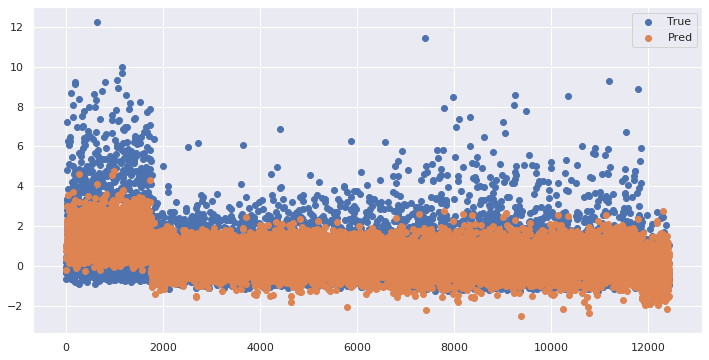

------- Test Evaluation -------

R2:	-16078596519195597340672.00000
RMSE:	92649206502.93700


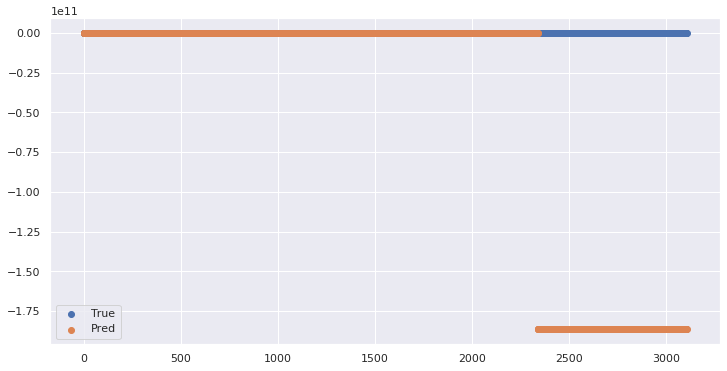

In [0]:
linear_regr = LinearRegression(fit_intercept=True)

# SIMPLEST VERSION
linear_regr.fit(x_train, y_train)

train_r2_linear, train_rmse_linear = test_evaluation(linear_regr, x_train, y_train)

r2_linear, rmse_linear = test_evaluation(linear_regr, x_valid, y_valid)

In [0]:
models_dict['Model'].append('Lin.Regr.')
models_dict['R2'].append(r2_linear)
models_dict['RMSE'].append(rmse_linear)

## Ridge Regression

In [0]:
alphas = [0.001, 0.01, 0.05, 0.1, 0.3, 0.07, 1, 2, 2.5, 3, 4, 5]

params = {'alpha':alphas}
res = grid_search_cv(Ridge(), params, x_train, y_train, k_fold=10, verbose=1)

df_score = pd.DataFrame({'Alpha':alphas, 'score':res.cv_results_['mean_test_score']})
df_score = df_score.sort_values(by='score', ascending=False)
display(df_score.head())

best_alpha = df_score.iloc[0]['Alpha']
best_alpha

Ridge(alpha=5, copy_X=True, fit_intercept=True, max_iter=None, normalize=False,
      random_state=None, solver='auto', tol=0.001)


,Alpha,score
11,5.0,-0.896131
10,4.0,-0.896664
9,3.0,-0.897310
8,2.5,-0.897694
7,2.0,-0.898131


5.0

------- Test Evaluation -------

R2:	0.37800
RMSE:	0.82962


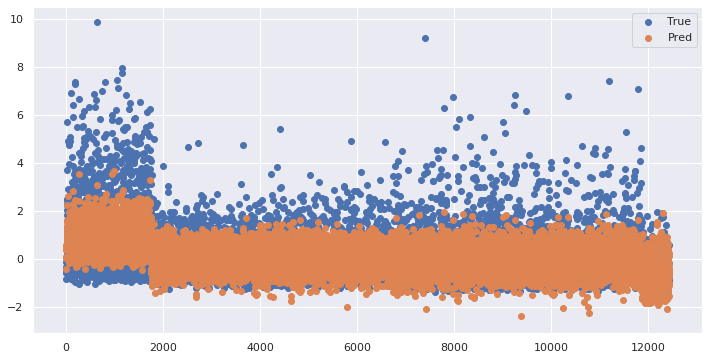

------- Test Evaluation -------

R2:	-0.34670
RMSE:	0.70212


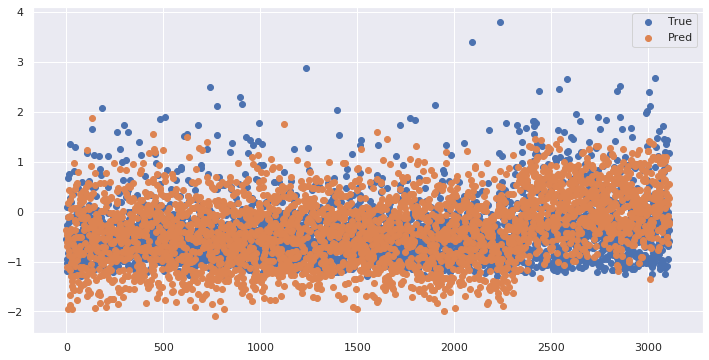

In [0]:
ridge_model = Ridge(alpha=best_alpha).fit(x_train, y_train)

r2_ridge, rmse_ridge = test_evaluation(ridge_model, x_train, y_train)

r2_ridge, rmse_ridge = test_evaluation(ridge_model, x_valid, y_valid)

In [0]:
models_dict['Model'].append('Ridge.Regr.')
models_dict['R2'].append(r2_ridge)
models_dict['RMSE'].append(rmse_ridge)

## Lasso Regression

In [0]:
alphas = [0.001, 0.01, 0.05, 0.1, 0.3, 0.07, 1, 2, 2.5, 3, 4, 5]
params = {'alpha':alphas}

res = grid_search_cv(Lasso(), params, x_train, y_train, k_fold=10, verbose=1)

df_score = pd.DataFrame({'Alpha':alphas, 'score':res.cv_results_['mean_test_score']})
df_score = df_score.sort_values(by='score', ascending=True)
display(df_score.head())

best_alpha = df_score.iloc[0]['Alpha']
best_alpha

Fitting 10 folds for each of 12 candidates, totalling 120 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/home/daniele/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 123.19185873165316, tolerance: 0.9337088845910049
  positive)
/home/daniele/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 466.8042663044225, tolerance: 1.1530475798427269
  positive)
/home/daniele/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 900.7928942998415, tolerance: 1.3145861572000885
  positive)
/home/daniele/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_desce

KeyboardInterrupt: 

------- Test Evaluation -------

R2:	-0.70968
RMSE:	0.27797


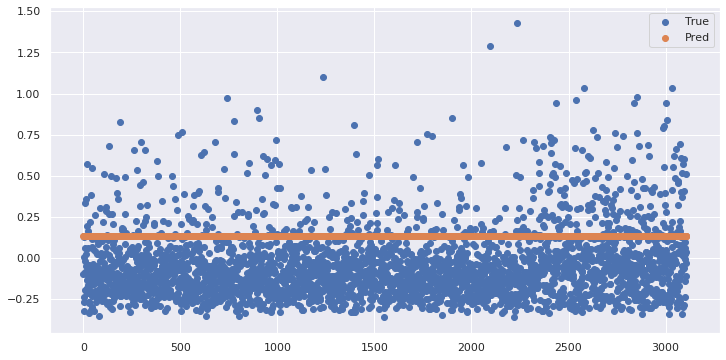

In [0]:
lasso_model = Lasso(best_alpha).fit(x_train, y_train)

r2_lasso, rmsle_lasso = test_evaluation(lasso_model, x_valid, y_valid)

In [0]:
models_dict['Model'].append('Lasso.Regr.')
models_dict['R2'].append(r2_ridge)
models_dict['RMSE'].append(rmse_ridge)

# Tree-based Models

## Preprocessing

Without ID Feature

In [0]:
train_data_x = train.drop(['ID', 'target'], axis=1)
train_data_y = train.target

test_data_x = test.drop(['ID'], axis=1)

With ID Feature

In [0]:
train_data_x = train.drop(['target'], axis=1)
train_data_y = train.target

test_data_x = test

### Filling NaNs

In [0]:
all_data = train_data_x.append(test_data_x)
all_data = fillna_features(all_data)

train_size, test_size = train_data_x.shape[0], test_data_x.shape[0]


train_data_x, test_data_x = all_data.iloc[:train_size], all_data.iloc[train_size:]

### Scaling

Standard Scaling

In [0]:
train_x_scaled, train_y_scaled, test_x_scaled, y_std_scaler = standard_scaling(train_data_x,
                                                                               train_data_y,
                                                                               test_data_x)

Robust Scaling

In [0]:
a, b = 5, 95

train_x_scaled, train_y_scaled, test_x_scaled, y_rob_scaler = robust_scaling(train_data_x,
                                                                               train_data_y,
                                                                               test_data_x,
                                                                               a, b)

### Split Data

Scaled Data

In [0]:
x_train, y_train, x_valid, y_valid = split_data(train_x_scaled, train_y_scaled)

((12431, 780), (12431, 1)) ((3108, 780), (3108, 1))


Non-Scaled Data

In [23]:
x_train, y_train, x_valid, y_valid = split_data(train_data_x, train_data_y)
x_test = test_data_x

((12431, 780), (12431,)) ((3108, 780), (3108,))


## Random Forest

In [0]:
rf = RandomForestRegressor(random_state = 10)

depth = [20, 30]
n_features = [20]
n_est = [300]

params = {'max_depth':depth, 'n_estimators':n_est, 'max_features':n_features}

rf_grid = grid_search_cv(rf, params, x_train, y_train.ravel(),
                         k_fold=10,
                         verbose=10, n_jobs=-1)

Fitting 10 folds for each of 2 candidates, totalling 20 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:  1.6min
/home/daniele/anaconda3/lib/python3.7/site-packages/joblib/externals/loky/process_executor.py:706: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning
[Parallel(n_jobs=-1)]: Done   8 out of  20 | elapsed:  1.7min remaining:  2.5min
[Parallel(n_jobs=-1)]: Done  11 out of  20 | elapsed:  3.5min remaining:  2.8min
[Parallel(n_jobs=-1)]: Done  14 out of  20 | elapsed:  3.5min remaining:  1.5min
[Parallel(n_jobs=-1)]: Done  17 out of  20 | elapsed:  4.6min remaining:   48.4s
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:  4.7min remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:  4.7min finished


RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=30, max_features=20, max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=300, n_jobs=None, oob_score=False,
                      random_state=10, verbose=0, warm_start=False)


In [0]:
rf_grid.best_score_

-29.95313840312675

In [0]:
rf_grid.best_params_

{'max_depth': 30, 'max_features': 20, 'n_estimators': 300}

------- Test Evaluation -------

R2:	0.29050
RMSE:	21.59402


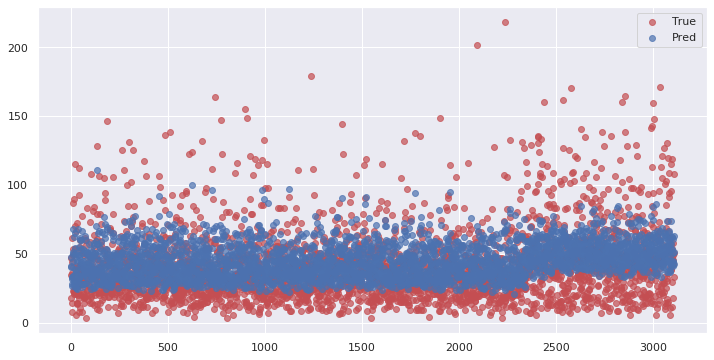

In [0]:
r2_rf, rmse_rf = test_evaluation(rf_grid, x_valid, y_valid) #0.15, 0.55

In [0]:
features_importance = pd.Series(rf_grid.best_estimator_.feature_importances_,
                                index=train.columns.drop(['ID', 'target']))
feat_import_rf = features_importance.sort_values(ascending=False)

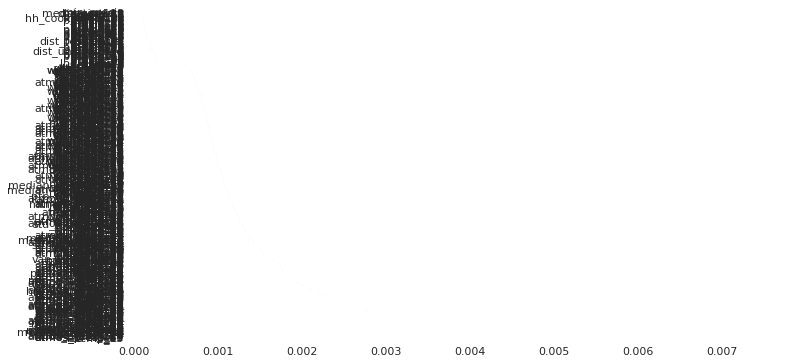

In [0]:
feat_import_rf.plot.barh()

In [0]:
threshold = 0.004
feat_imp_cols = feat_import_rf[feat_import_rf > threshold].index
feat_imp_cols

Index(['temp_65', 'atmos_press_43', 'atmos_press_81', 'atmos_press_20',
       'temp_64', 'atmos_press_117', 'atmos_press_116', 'atmos_press_9',
       'atmos_press_24', 'atmos_press_70', 'max_atmos_press',
       'mean_atmos_press', 'atmos_press_67', 'atmos_press_33', 'temp_15',
       'atmos_press_95', 'atmos_press_104', 'temp_80', 'median_wind_spd'],
      dtype='object')

### After Feature Importance 

In [0]:
rf = RandomForestRegressor(random_state = 10)

depth = [30]
n_features = [5]
n_est = [300]

params = {'max_depth':depth, 'n_estimators':n_est, 'max_features':n_features}

rf_grid = grid_search_cv(rf, params, x_train, y_train.ravel(), k_fold=5, verbose=4, n_jobs=-1)

Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   14.7s remaining:   22.1s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   18.9s finished


RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=30, max_features=5, max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=300, n_jobs=None, oob_score=False,
                      random_state=10, verbose=0, warm_start=False)


In [0]:
r2_rf, rmse_rf = test_evaluation(rf_grid.best_estimator_, x_valid, y_valid) #0.15, 0.55

------- Test Evaluation -------

R2:	0.55950
RMSE:	0.23253


AttributeError: 'AxesSubplot' object has no attribute 'show'

In [0]:
rf_grid.best_params_

{'max_depth': 30, 'max_features': 5, 'n_estimators': 300}

In [0]:
models_dict['Model'].append('Random_Foresr')
models_dict['R2'].append(r2_rf)
models_dict['RMSE'].append(rmse_rf)

# XGBoost

In [0]:
import xgboost
from xgboost import XGBRegressor, plot_importance

### Search Params

In [0]:
def grid_search_cv_xgb(model, parameters, x_train, y_train, k_fold=10, verbose=0, n_jobs=1):
    
    result = GridSearchCV(model, parameters, cv=KFold(k_fold),
                                   scoring='neg_root_mean_squared_error',
                                     verbose=verbose,
                                         n_jobs=n_jobs).fit(x_train, y_train)
    print(result.best_estimator_)
    
    return result

In [0]:
xgb = XGBRegressor(objective='reg:squarederror',
                   eval_metric = 'rmse',
                   random_state=2020,
                   tree_method='gpu_hist')

params = {'n_estimators':[200],
          'max_depth':[25],
          'lr':[0.01],
          'min_child_weight':[100],
          'subsample':[0.6],
          'alpha':[1, 5, 10],
          'n_jobs':[-1],
          'seed':[2020]}

res_xgb = grid_search_cv(xgb, params, x_train, y_train,
                         k_fold=10, verbose=10, n_jobs=-1)

Fitting 10 folds for each of 3 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:  2.1min
/usr/local/lib/python3.6/dist-packages/joblib/externals/loky/process_executor.py:706: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed: 10.5min


KeyboardInterrupt: ignored

In [0]:
res_xgb.best_params_

{'alpha': 1,
 'lr': 0.01,
 'max_depth': 25,
 'min_child_weight': 100,
 'n_estimators': 200,
 'n_jobs': -1,
 'seed': 2020,
 'subsample': 0.6}

In [0]:
res_xgb.best_score_

-28.820544020590678

In [0]:
res_xgb.cv_results_

{'mean_fit_time': array([126.36892543, 125.14944706, 125.47565479]),
 'mean_score_time': array([0.13295562, 0.12535186, 0.13402028]),
 'mean_test_score': array([-28.82054402, -28.82054402, -28.82054402]),
 'param_alpha': masked_array(data=[1, 0.5, 0.1],
              mask=[False, False, False],
        fill_value='?',
             dtype=object),
 'param_lr': masked_array(data=[0.01, 0.01, 0.01],
              mask=[False, False, False],
        fill_value='?',
             dtype=object),
 'param_max_depth': masked_array(data=[25, 25, 25],
              mask=[False, False, False],
        fill_value='?',
             dtype=object),
 'param_min_child_weight': masked_array(data=[100, 100, 100],
              mask=[False, False, False],
        fill_value='?',
             dtype=object),
 'param_n_estimators': masked_array(data=[200, 200, 200],
              mask=[False, False, False],
        fill_value='?',
             dtype=object),
 'param_n_jobs': masked_array(data=[-1, -1, -1],
    

## Model

In [0]:
kfold = KFold(n_splits=20,
              shuffle=True,
              random_state=2020)

In [0]:
def kfold_xgb(data, params):

    preds = []

    x_train, y_train = data['x_train'], data['y_train']
    x_valid, y_valid = data['x_valid'], data['y_valid']
    x_test = data['x_test']
    
    kfold = params['kfold']
    
    counter = 0
    for train_i, valid_i in kfold.split(x_train, y_train):
        x, y = x_train.iloc[train_i], y_train.iloc[train_i]
        
        print('\n> Fold {}\n'.format(counter))
        xgb = XGBRegressor(objective='reg:squarederror',
                           eval_metric = 'rmse',
                           n_estimators=params['n_estimators'],
                           max_depth=params['max_depth'],
                           learning_rate=params['lr'],
                           subsample=params['subsample'],
                           min_child_weight=params['min_child_weight'], 
                           n_jobs=params['n_jobs'],
                           random_state=params['seed'],
                           
                           tree_method='gpu_hist')
        
        xgb.fit(x,y, early_stopping_rounds=params['stop'], eval_set=[(x_valid, y_valid)])
        
        pred = xgb.predict(x_test)
        preds.append(pred)
        
        counter += 1
    
    return xgb, preds

In [0]:
kfold = KFold(n_splits=20,
              shuffle=True,
              random_state=2020)

params = {'n_estimators':500,
          'max_depth':20,
          'lr':0.02,
          'min_child_weight':30,
          'subsample':0.5,
          'alpha':10,
          'stop':20,
          'n_jobs':-1,
          'seed':2020,
          'kfold':kfold}

In [27]:
training_data = {'x_train':x_train,
                 'y_train':y_train,
                 'x_valid':x_valid,
                 'y_valid':y_valid,
                 'x_test' :x_test}

params = {'n_estimators':500,
          'max_depth':20,
          'lr':0.02,
          'min_child_weight':30,
          'subsample':0.5,
          'alpha':10,
          'stop':20,
          'n_jobs':-1,
          'seed':2020,
          'kfold':kfold}


xgb, test_xgb = kfold_xgb(training_data, params)

Streaming output truncated to the last 5000 lines.
Stopping. Best iteration:
[444]	validation_0-rmse:20.5396


> Fold 9

[0]	validation_0-rmse:47.1127
Will train until validation_0-rmse hasn't improved in 20 rounds.
[1]	validation_0-rmse:46.3899
[2]	validation_0-rmse:45.6664
[3]	validation_0-rmse:44.9869
[4]	validation_0-rmse:44.3618
[5]	validation_0-rmse:43.7065
[6]	validation_0-rmse:43.0476
[7]	validation_0-rmse:42.4569
[8]	validation_0-rmse:41.8806
[9]	validation_0-rmse:41.2752
[10]	validation_0-rmse:40.7618
[11]	validation_0-rmse:40.2094
[12]	validation_0-rmse:39.678
[13]	validation_0-rmse:39.1673
[14]	validation_0-rmse:38.6463
[15]	validation_0-rmse:38.1248
[16]	validation_0-rmse:37.6488
[17]	validation_0-rmse:37.2523
[18]	validation_0-rmse:36.6757
[19]	validation_0-rmse:36.2055
[20]	validation_0-rmse:35.7379
[21]	validation_0-rmse:35.3057
[22]	validation_0-rmse:34.9106
[23]	validation_0-rmse:34.5163
[24]	validation_0-rmse:34.0778
[25]	validation_0-rmse:33.7378
[26]	validation_0-r

In [76]:
r2_xgb, rmse_xgb = test_evaluation(xgb, x_valid, y_valid) # 0.34 - 20.71

------- Test Evaluation -------



ValueError: ignored

In [0]:
mean_prediction = np.mean(test_xgb,0)

In [0]:
#prediction = xgb.predict(x_test)

In [31]:
sub = pd.read_csv('/content/drive/My Drive/Data_csv/AirQo/sample_sub.csv')
sub.target = mean_prediction
sub.ID = test_id
print('Min:\t{}'.format(sub.target.min()))
print('Max:\t{}'.format(sub.target.max()))
print('Mean:\t{}'.format(sub.target.mean()))
sub

Min:	19.832706451416016
Max:	236.24118041992188
Mean:	64.63003540039062


,ID,target
0,ID_test_0,149.398102
1,ID_test_1,89.068878
2,ID_test_100,67.316353
3,ID_test_1003,47.135796
4,ID_test_1006,34.662228
...,...,...
5030,ID_test_969,32.628597
5031,ID_test_980,30.021015
5032,ID_test_983,41.802986
5033,ID_test_986,39.969387


In [0]:
sub.to_csv('submission_xgb.csv', index=False)

## Feature selection

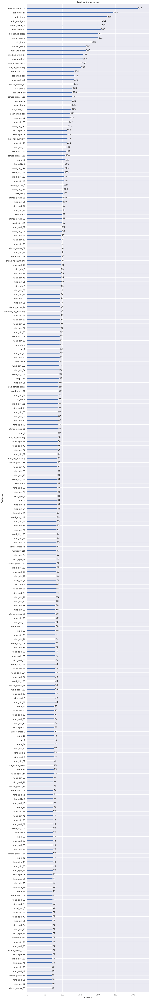

In [49]:
max_feat = int(len(x_train.columns) * 0.3)

ax = plot_importance(xgb, max_num_features=max_feat)
ax.figure.set_figheight(100)

In [0]:
feat_imp = xgb.feature_importances_
feat_imp_df = pd.Series(feat_imp, index=x_train.columns)

In [125]:
drop_cols = feat_imp_df[feat_imp_df < 0.0012].index
drop_cols

Index(['location', 'precip_0', 'wind_dir_0', 'wind_spd_0', 'temp_1',
       'precip_1', 'wind_dir_1', 'wind_spd_1', 'precip_2', 'wind_dir_2',
       ...
       'km2', 'aspect', 'dist_tertiary', 'dist_unclassified',
       'dist_residential', 'popn', 'hh', 'hh_cook_charcoal',
       'hh_cook_firewood', 'hh_burn_waste'],
      dtype='object', length=539)

In [0]:
sel_x_train = x_train.drop(drop_cols, axis=1)
sel_x_test = x_test.drop(drop_cols, axis=1)

In [0]:
sel_x_valid = x_valid.drop(drop_cols, axis=1)

In [0]:
training_data = {'x_train':sel_x_train,
                 'y_train':y_train,
                 'x_valid':sel_x_valid,
                 'y_valid':y_valid,
                 'x_test' :sel_x_test}

params = {'n_estimators':500,
          'max_depth':20,
          'lr':0.04,
          'min_child_weight':30,
          'subsample':0.5,
          'alpha':5,
          'stop':20,
          'n_jobs':-1,
          'seed':2020,
          'kfold':kfold}


xgb, test_xgb = kfold_xgb(training_data, params)


> Fold 0

[0]	validation_0-rmse:46.4394
Will train until validation_0-rmse hasn't improved in 20 rounds.
[1]	validation_0-rmse:45.0842
[2]	validation_0-rmse:43.7647
[3]	validation_0-rmse:42.5591
[4]	validation_0-rmse:41.4831
[5]	validation_0-rmse:40.3135
[6]	validation_0-rmse:39.2978
[7]	validation_0-rmse:38.3302
[8]	validation_0-rmse:37.3107
[9]	validation_0-rmse:36.3881
[10]	validation_0-rmse:35.5939
[11]	validation_0-rmse:34.8021
[12]	validation_0-rmse:34.0941
[13]	validation_0-rmse:33.3192
[14]	validation_0-rmse:32.5967
[15]	validation_0-rmse:31.8456
[16]	validation_0-rmse:31.2831
[17]	validation_0-rmse:30.7989
[18]	validation_0-rmse:30.16
[19]	validation_0-rmse:29.6502
[20]	validation_0-rmse:29.1624
[21]	validation_0-rmse:28.648
[22]	validation_0-rmse:28.2066
[23]	validation_0-rmse:27.6351
[24]	validation_0-rmse:27.2411
[25]	validation_0-rmse:26.8954
[26]	validation_0-rmse:26.6036
[27]	validation_0-rmse:26.3415
[28]	validation_0-rmse:26.065
[29]	validation_0-rmse:25.8343
[30]	val

------- Test Evaluation -------

R2:	0.36034
RMSE:	20.50370


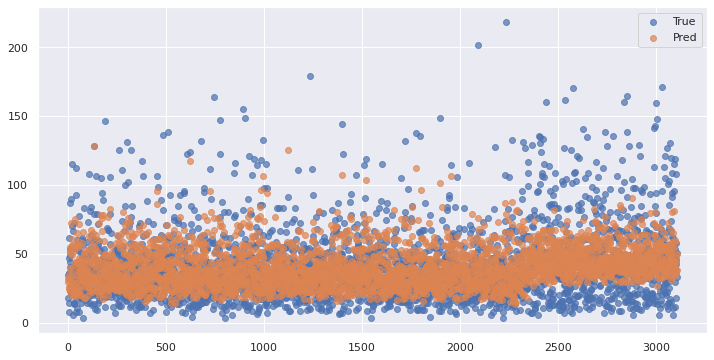

In [134]:
r2_xgb, rmse_xgb = test_evaluation(xgb, sel_x_valid, y_valid) # 0.354 - 20.60

In [0]:
mean_prediction = np.mean(test_xgb,0)

In [136]:
sub = pd.read_csv('/content/drive/My Drive/Data_csv/AirQo/sample_sub.csv')
sub.target = mean_prediction
sub.ID = test_id
print('Min:\t{}'.format(sub.target.min()))
print('Max:\t{}'.format(sub.target.max()))
print('Mean:\t{}'.format(sub.target.mean()))
sub

Min:	19.88836097717285
Max:	243.1665802001953
Mean:	64.5438461303711


,ID,target
0,ID_test_0,140.482727
1,ID_test_1,92.024216
2,ID_test_100,62.288799
3,ID_test_1003,44.873741
4,ID_test_1006,35.356514
...,...,...
5030,ID_test_969,38.789883
5031,ID_test_980,32.572464
5032,ID_test_983,49.075645
5033,ID_test_986,40.884666


In [0]:
sub.to_csv('submission_xgb.csv', index=False)

In [0]:
from sklearn.feature_selection import SelectFromModel

In [58]:
threshold = 100

selection = SelectFromModel(xgb, threshold, prefit=True)
sel_x_train = selection.transform((x_train.dropna()))

/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/_base.py:81: UserWarning: No features were selected: either the data is too noisy or the selection test too strict.
  UserWarning)


In [59]:
sel_x_train

array([], shape=(5738, 0), dtype=float64)

In [0]:
xgb = XGBRegressor(objective='reg:squarederror',
                   eval_metric = 'rmse',
                   n_estimators=1000, 
                   max_depth=5,
                   learning_rate=0.01,
                   n_jobs=8).fit(x_train, y_train,
                                          early_stopping_rounds=10,
                                          eval_set=[(x_valid, y_valid)])

------- Test Evaluation -------

R2:	0.25930
RMSE:	22.06370


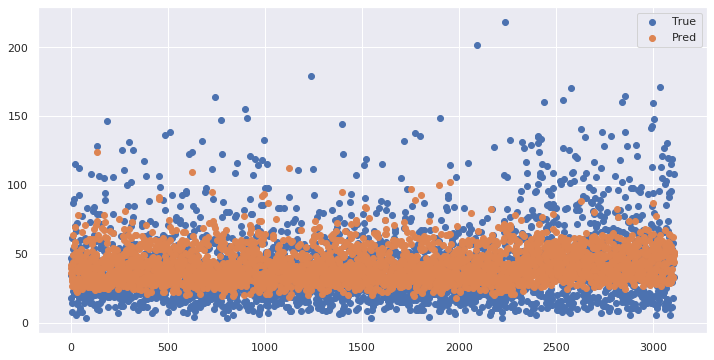

(0.25929905863056857, 22.063700641132744)

In [0]:
test_evaluation(xgb, x_valid, y_valid) #0.73     500,15,0.3 (Standard scaler)
                                     #0.15     500,15,0.3 (robust scaler 1-99)

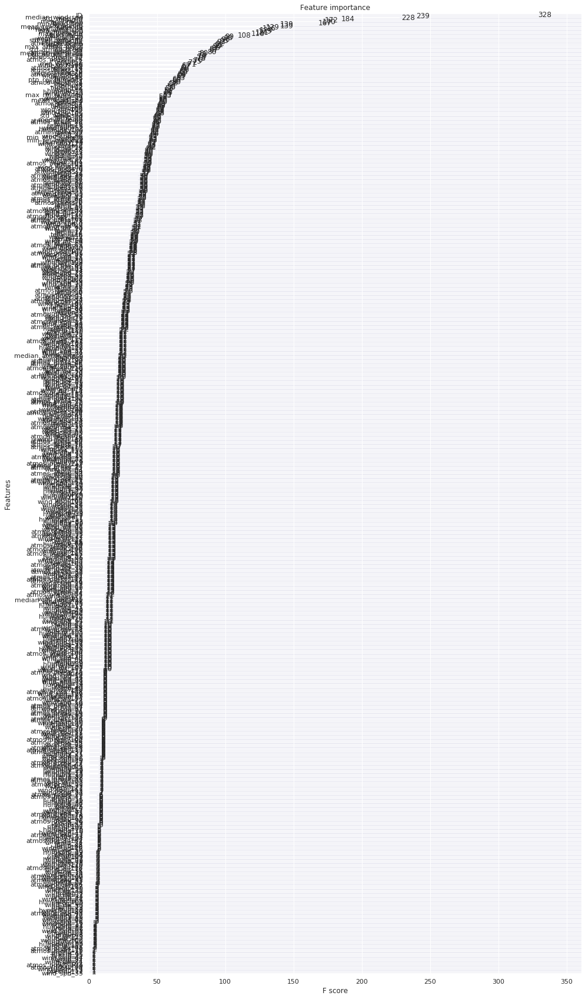

In [0]:
sn.set(rc={'figure.figsize':(15,30)})
xgboost.plot_importance(xgb)

In [0]:
corr = train.corr()
corr.style.background_gradient()

# CatBoost

In [0]:
from catboost import CatBoostRegressor

In [0]:
kfold = KFold(n_splits=20,
              shuffle=True)

In [0]:
def kfold_cat(data, params):

    preds = []

    x_train, y_train = data['x_train'], data['y_train']
    x_valid, y_valid = data['x_valid'], data['y_valid']
    x_test = data['x_test']
    
    kfold = params['kfold']
    
    counter = 0
    for train_i, valid_i in kfold.split(x_train, y_train):
        x, y = x_train.iloc[train_i], y_train.iloc[train_i]
        
        print('\n> Fold {}\n'.format(counter))
        cat = CatBoostRegressor(n_estimators=params['n_estimators'],
                                eval_metric='RMSE',
                                max_depth=params['max_depth'],
                                learning_rate=params['lr'],
                                subsample=params['subsample'],
                                random_seed= params['seed'],
                                use_best_model=True,
                                task_type='GPU')
        
        cat.fit(x,y,
               eval_set=[(x,y),(x_valid, y_valid)],
               early_stopping_rounds=20,
               verbose=100)
        
        pred = cat.predict(x_test)
        preds.append(pred)
        
        counter += 1
    
    return cat, preds

In [0]:
training_data = {'x_train':x_train,
                 'y_train':y_train,
                 'x_valid':x_valid,
                 'y_valid':y_valid,
                 'x_test' :x_test}

params = {'n_estimators':300,
          'max_depth':10,
          'lr':0.01,
          'min_child_weight':10,
          'subsample':0.6,
          'stop':20,
          'n_jobs':8,
          'seed':2020,
          'kfold':kfold}


cat, cat_test_pred = kfold_cat(training_data, params)

In [0]:
mean_prediction = np.mean(cat_test_pred, 0)

In [0]:
r2_cat, rmse_cat = test_evaluation(cat, x_valid, y_valid)

In [0]:
sub = pd.read_csv('/content/drive/My Drive/Data_csv/AirQo/sample_sub.csv')
sub.target = mean_prediction
sub.ID = test_id
print('Min:\t{}'.format(sub.target.min()))
print('Max:\t{}'.format(sub.target.max()))
print('Mean:\t{}'.format(sub.target.mean()))
sub

Min:	23.7596492767334
Max:	221.162109375
Mean:	60.5827522277832


,ID,target
0,ID_test_0,143.147614
1,ID_test_1,71.397484
2,ID_test_100,69.537552
3,ID_test_1003,43.935555
4,ID_test_1006,38.278637
...,...,...
5030,ID_test_969,31.333155
5031,ID_test_980,29.067490
5032,ID_test_983,41.206173
5033,ID_test_986,35.660172


In [0]:
sub.to_csv('submission_xgb_mean.csv', index=False)

# Submission

## XGB submission

No scaling

In [0]:
prediction = xgb.predict(x_test)

Standard Scaling

In [0]:
prediction = xgb.predict(x_test)
prediction = inverse_std_scaling(prediction.reshape(-1,1), y_std_scaler)

Robust Scaling

In [0]:
prediction = xgb.predict(x_test)
prediction = inverse_robust_scaling(prediction.reshape(-1,1), y_rob_scaler)

## Random Forest

No Scaling

In [0]:
prediction = rf_grid.predict(x_test)

Standard Scaling

In [0]:
prediction = rf_grid.predict(x_test)
prediction = inverse_std_scaling(prediction, y_std_scaler)

Robust Scaling

In [0]:
prediction = rf_grid.predict(x_test)
prediction = inverse_robust_scaling(prediction.reshape(-1,1), y_rob_scaler)

# Submission File

In [0]:
sub = pd.read_csv('/content/drive/My Drive/Data_csv/AirQo/sample_sub.csv')
sub.target = prediction
sub.ID = test_id
print('Min:\t{}'.format(sub.target.min()))
print('Max:\t{}'.format(sub.target.max()))
print('Mean:\t{}'.format(sub.target.mean()))
sub

Min:	32.02550506591797
Max:	193.474365234375
Mean:	55.06316375732422


,ID,target
0,ID_test_0,133.893707
1,ID_test_1,76.826752
2,ID_test_100,62.157974
3,ID_test_1003,41.302769
4,ID_test_1006,41.321850
...,...,...
5030,ID_test_969,35.966579
5031,ID_test_980,33.268185
5032,ID_test_983,43.116005
5033,ID_test_986,39.965229


In [0]:
sub.to_csv('submission_xgb_1.csv', index=False)